# 0.0 Package installation

Welcome! To proceed make sure to run the following code and ensure that all dependencies are installed. Experiments have been done using python 3.12 and tensorflow 2.18.

In [ ]:
!pip install -r requirements.txt

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python

import io # Input/Output Module
import os # OS interfaces
import cv2 # OpenCV package
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from urllib import request # module for opening HTTP requests
from matplotlib import pyplot as plt # Plotting library

from deepface import DeepFace

from pathlib import Path 
from sklearn.model_selection import train_test_split, GridSearchCV
from itertools import product
from collections import defaultdict
from skimage.feature import hog
from skimage.color import rgb2gray
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from PIL import Image, ImageOps, ImageEnhance
from typing import List 
from sklearn.decomposition import PCA
from skimage.transform import resize
from skimage.color import rgb2gray
from sklearn.manifold import TSNE
from PIL import Image
import albumentations as A

from collections import Counter
import gc

from IPython.display import display, clear_output

import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

<div style="width:100%; height:140px">
    <img src="https://upload.wikimedia.org/wikipedia/commons/4/49/KU_Leuven_logo.svg" width = 300px, heigh = auto align=left>
</div>

KUL H02A5a Computer Vision: Group Assignment 1
---------------------------------------------------------------

Welcome!

In this tutorial, we explore the evolution of feature representations for face recognition, from traditional handcrafted features to modern deep learning-based embeddings. Understanding feature representations is crucial for extracting meaningful information from images and improving classification performance.

---------------------------------------------------------------
This notebook is structured as follows:
0. Data loading & Preprocessing
1. Feature Representations
2. Evaluation Metrics 
3. Classifiers
4. Experiments
5. Publishing best results
6. Discussion
    
---------------------------------------------------------------
# 0. Data loading & Preprocessing

## 0.1. Loading data
The training set is many times smaller than the test set and this might strike you as odd, however, this is close to a real world scenario where your system might be put through daily use! In this session we will try to do the best we can with the data that we've got! 

In [2]:
# Input data files are available in the read-only "../input/" directory

train = pd.read_csv(
    'data/train_set.csv', index_col = 0)
train.index = train.index.rename('id')

test = pd.read_csv(
    'data/test_set.csv', index_col = 0)
test.index = test.index.rename('id')

# read the images as numpy arrays and store in "img" column
train['img'] = [cv2.cvtColor(np.load('data/train/train_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in train.iterrows()]

test['img'] = [cv2.cvtColor(np.load('data/test/test_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in test.iterrows()]
  

train_size, test_size = len(train),len(test)

"The training set contains {} examples, the test set contains {} examples.".format(train_size, test_size)

'The training set contains 80 examples, the test set contains 1816 examples.'

*Note: this dataset is a subset of the* [*VGG face dataset*](https://www.robots.ox.ac.uk/~vgg/data/vgg_face/).

## 0.2. A first look
Let's have a look at the data columns and class distribution.

In [3]:
# The training set contains an identifier, name, image information and class label
train.head(1)

,name,class,img
id,,,
0,Mila_Kunis,2,"[[[50, 31, 25], [49, 30, 24], [49, 30, 24], [4..."


In [4]:
# The test set only contains an identifier and corresponding image information.

test.head(1)

,img
id,
0,"[[[209, 210, 205], [208, 209, 204], [208, 209,..."


In [5]:
# The class distribution in the training set:
train.groupby('name').agg({'img':'count', 'class': 'max'})

,img,class
name,,
Jesse_Eisenberg,30,1
Michael_Cera,10,0
Mila_Kunis,30,2
Sarah_Hyland,10,0


Note that **Jesse is assigned the classification label 1**, and **Mila is assigned the classification label 2**. The dataset also contains 20 images of **look alikes (assigned classification label 0)** and the raw images. 

## 0.3. Preprocess data
### 0.3.1 DNN face detector
In this example we use the [OpenCV DNN module](https://docs.opencv.org/4.x/d0/dd4/tutorial_dnn_face.html) to detect faces, then the faces are resized so that they all have the same shape. If there are multiple faces in an image, we only take the first one.


In [3]:
class DNNPreprocessor():
    """
    Preprocessing pipeline built around opencv's DNN module Face Detection
    Uses provided methods from HAARPreprocessor and adapted detect_faces
    It can be used as a direct replacement to HAARPreprocessor
    """
    def __init__(self, face_size,
                 dnn_path,
                 config_path):
        self.face_size = face_size
        self.net = cv2.dnn.readNetFromCaffe(config_path, dnn_path)

    def detect_faces(self, frame, conf_threshold=0.5, expand_percent=20):
        # Get frame dimensions
        (h, w) = frame.shape[:2]

        # Preprocess the frame:
        # create a blob with mean subtraction as required by the model
        blob = cv2.dnn.blobFromImage(frame, 1.0, (300, 300),
                                     (104.0, 177.0, 123.0),
                                     swapRB=False, crop=False)

        # Get predictions from the network
        self.net.setInput(blob)
        detections = self.net.forward()

        faces = []
        # Loop over the detections
        for i in range(0, detections.shape[2]):
            confidence = detections[0, 0, i, 2]
            # Filter out weak detections based on the threshold
            if confidence > conf_threshold:
                # Compute the (x, y) coordinates of the bounding box
                box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
                (startx, starty, endx, endy) = box.astype("int")

                faces.append([startx, starty, endx - startx, endy - starty])

        return faces

    def extract_faces(self, img):
        """Returns all faces (cropped) in an image."""

        faces = self.detect_faces(img)

        return [img[y:y+h, x:x+w] for (x, y, w, h) in faces]

    def preprocess(self, data_row):
        faces = self.extract_faces(data_row['img'])

        # if no faces were found, return None
        if len(faces) == 0:
            nan_img = np.empty(self.face_size + (3,))
            nan_img[:] = np.nan
            return nan_img

        # only return the first face
        return cv2.resize(faces[0], self.face_size,
                          interpolation=cv2.INTER_AREA)

    def __call__(self, data):
        return np.stack([self.preprocess(row) for _,
                         row in data.iterrows()]).astype(int)

Let's detect some faces!

In [4]:
FACE_SIZE = (160, 160) # This parameter is tunable!

dnn_path="face_detection_module/res10_300x300_ssd_iter_140000.caffemodel"
config_path="face_detection_module/deploy.prototxt"

preprocessor = DNNPreprocessor(FACE_SIZE, dnn_path, config_path)
train_X, train_y = preprocessor(train), train['class'].values
test_X = preprocessor(test)
train_y = train['class'].values

**Visualise**

Let's plot a few examples.

In [5]:
# function to plot images in a grid
def plot_image_sequence(data, n, imgs_per_row=7):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)

    f,ax = plt.subplots(n_rows,n_cols, figsize=(10*n_cols,10*n_rows))
    for i in range(n):
        if n == 1:
            ax.imshow(data[i])
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i])
        else:
            ax[int(i%n)].imshow(data[i])
    plt.show()

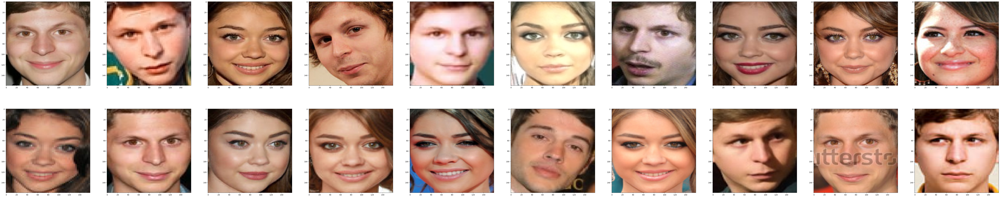

In [9]:
# plot faces of Michael and Sarah
plot_image_sequence(train_X[train_y == 0], n=20, imgs_per_row=10)

We can observe that by taking the first recognized face out of every photo, we also get background people's faces that do not belong to the subject we are looking for. We will solve this by manually going through the problematic indexes and replacing the faces with the correct ones. For this we will use the ``extract_faces`` function.

Example of problematic face fix;

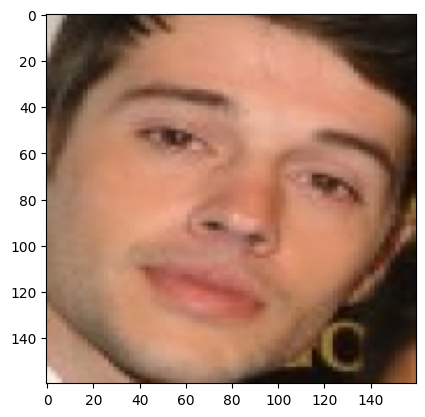

In [10]:
plt.imshow(train_X[train_y == 0][15])
plt.show()

This is definetely not Sarah Hyland! Find the photo in the original dataset.

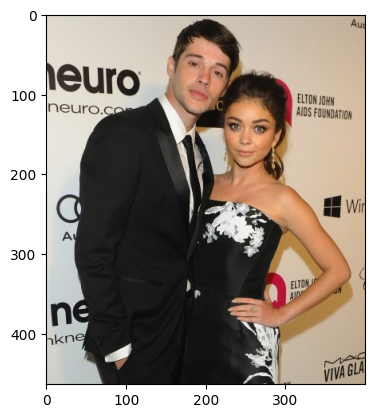

In [11]:
plt.imshow(train[train['class'] == 0].iloc[15]["img"])
plt.show()

We will now detect the faces of the photo and place the correct one to the corresponding index. We also create a function because the same processing will be done for the other classes

In [6]:
def replace_face(n_class, index):
    # Get faces of the requested photo
    faces = preprocessor.extract_faces(train[train['class'] == n_class].iloc[index]["img"])
    
    # Get the actual index for the requested image (using zero-based indexing)
    target_index = np.nonzero(train_y == n_class)[0][index]

    # Update the image at that index in train_X
    train_X[target_index] = cv2.resize(faces[1], FACE_SIZE, interpolation=cv2.INTER_AREA)

In [7]:
replace_face(0, 15)

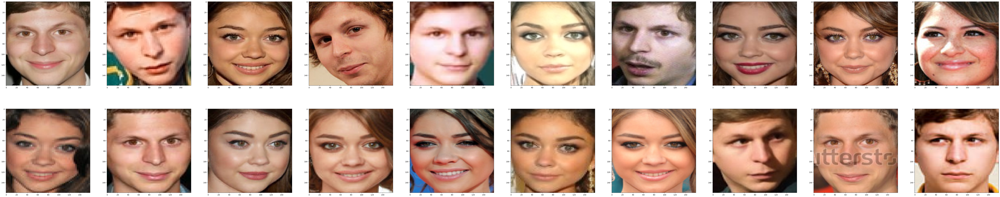

In [14]:
# plot faces of Michael and Sarah after applying the fix
plot_image_sequence(train_X[train_y == 0], n=20, imgs_per_row=10)

Now we have a perfect set of Michael and Sarah! Let's move to Jesse

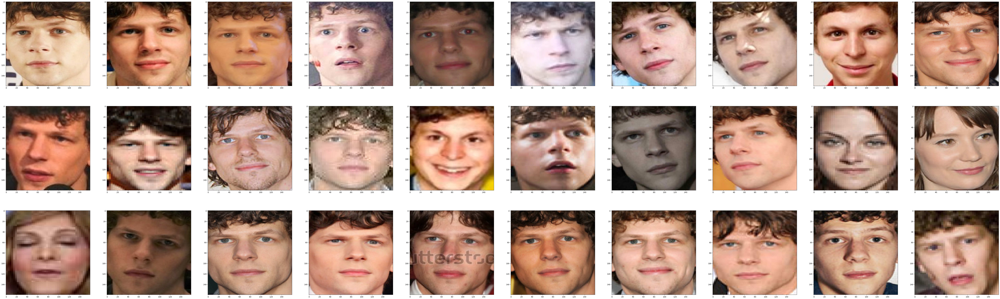

In [15]:
# plot faces of Jesse

plot_image_sequence(train_X[train_y == 1], n=30, imgs_per_row=10)

Again, this is not right! We have other people's faces. Let's replace them!

In [8]:
replace_face(1, 8)
replace_face(1, 14)
replace_face(1, 18)
replace_face(1, 19)
replace_face(1, 20)

Complete fixed training set for Jesse Eisenberg

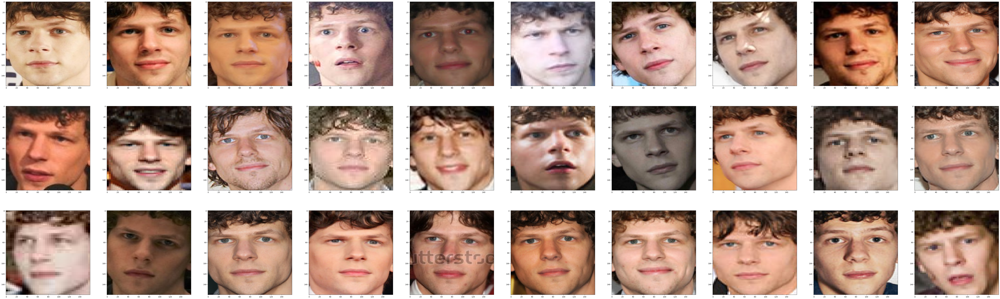

In [17]:
plot_image_sequence(train_X[train_y == 1], n=30, imgs_per_row=10)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9223372036854775808..-9223372036854775808].


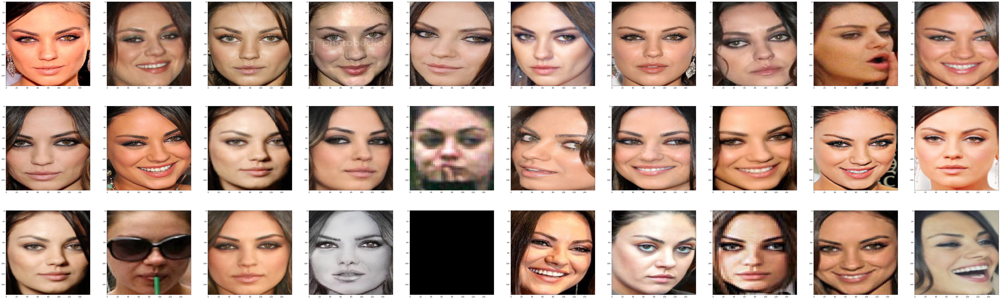

In [18]:
# plot faces of Mila
plot_image_sequence(train_X[train_y == 2], n=30, imgs_per_row=10)

We can also observe some problems here; One photo is black, signifying that no face was found. That is the expected behaviour since, as we will show further down, there is a photo in the training data without any face. Also the photo where Mila Kunis is wearing glasses is problematic since most of the face is occluded. Since nothing can be done for these photos, they will be removed. A visual check was conducted to ensure that all photos are indeed Mila Kunis. No other faces were found so no need to do any further modifications.  

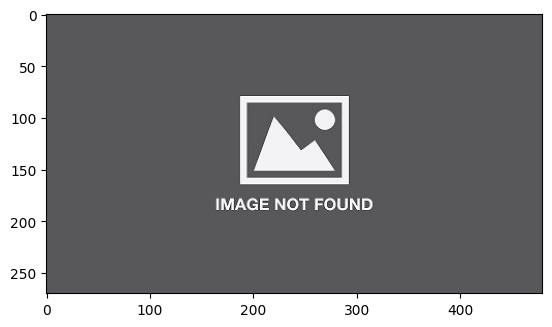

In [19]:
#This icon will be fully dropped from the training set
plt.imshow(train[train['class'] == 2].iloc[24]["img"])
plt.show()

In [9]:
# Find Mila's indices
indices = np.nonzero(train_y == 2)[0]

# Get the actual index of the problematic sample
problematic_index = indices[24]

# Drop the sample by filtering out that index
train_X = np.delete(train_X, problematic_index, axis=0)
# Also drop it from label data
train_y = np.delete(train_y, problematic_index, axis=0)

# Get the actual index of the problematic sample
problematic_index = indices[21]

# Drop the sample by filtering out that index
train_X = np.delete(train_X, problematic_index, axis=0)
# Also drop it from label data
train_y = np.delete(train_y, problematic_index, axis=0)

Fixed Mila Kunis Subset:

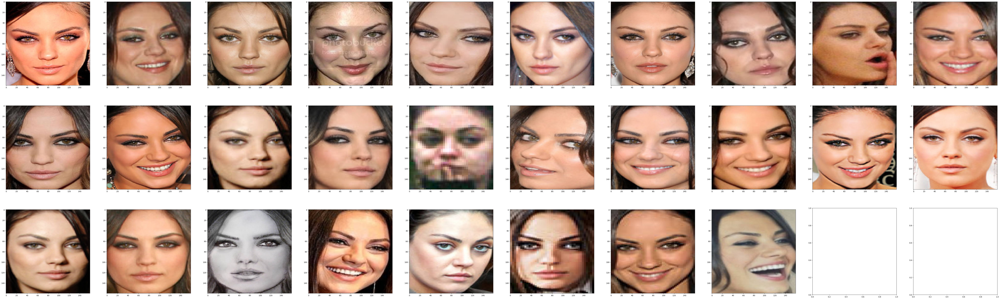

In [21]:
plot_image_sequence(train_X[train_y == 2], n=28, imgs_per_row=10)

## 0.4. Store Preprocessed data (optional)

In [20]:
# save preprocessed data
prep_path = 'prepped_data/'
if not os.path.exists(prep_path):
    os.mkdir(prep_path)
  
#np.save(os.path.join(prep_path, 'train_X.npy'), train_X)
#np.save(os.path.join(prep_path, 'train_y.npy'), train_y)
#np.save(os.path.join(prep_path, 'test_X.npy'), test_X)

# load preprocessed data
#prep_path = 'prepped_data/'
#if not os.path.exists(prep_path):
#    os.mkdir(prep_path)
#train_X = np.load(os.path.join(prep_path, 'train_X.npy'))
#train_y = np.load(os.path.join(prep_path, 'train_y.npy'))
#test_X = np.load(os.path.join(prep_path, 'test_X.npy'))
#np.save(os.path.join(prep_path, 'manual_test_X .npy'), processed_data)

Now we are ready to rock!

## 1.1. Handcrafted Features: HOG feature extractor


# <span style="color: #2E86C1;">Overview of the HOG Process</span>

The **<span style="color: #E74C3C;">Histogram of Oriented Gradients (HOG)</span>** descriptor is a powerful tool for capturing the shape and structure of objects in an image. Here’s a brief summary of its key steps and benefits:

- **<span style="color: #27AE60;">Preprocessing:</span>**  
  The image is first preprocessed by selecting a region (or patch) and resizing it to a fixed dimension (e.g., **64×128 pixels**). This ensures <span style="color: #E67E22;">consistency</span> across different images.

- **<span style="color: #27AE60;">Gradient Extraction:</span>**  
  Gradients (both <span style="color: #E74C3C;">magnitude</span> and <span style="color: #E74C3C;">direction</span>) are computed for each pixel, capturing how the brightness changes. These gradients highlight the edges and structures within the image.

- **<span style="color: #27AE60;">Cell-Level Histogram Formation:</span>**  
  The image is divided into small **8×8 cells**. For each cell, a **<span style="color: #E74C3C;">9-bin histogram</span>** is calculated—each bin representing a range of gradient directions (0°–180° divided into 9 equal intervals).  
  <span style="color: #E67E22;">(The 9×1 histogram represents the distribution of gradient orientations within that cell.)</span>

- **<span style="color: #27AE60;">Block Normalization:</span>**  
  To make the descriptor robust against variations in lighting and contrast, adjacent 8×8 cell histograms are concatenated into larger **16×16 blocks**. Each block forms a **36×1 vector** (since 4 cells × 9 bins = 36), which is then normalized.  
  The normalization window is moved across the image (typically by **8 pixels** with overlap), ensuring that local contrast differences are minimized and the descriptor becomes invariant to changes in brightness.

- **<span style="color: #27AE60;">Final Feature Vector:</span>**  
  The normalized vectors from all blocks are concatenated to produce the final HOG feature vector (e.g., **3780 elements** for a 64×128 image patch). This vector encapsulates the edge and gradient structure of the image in a compact form, making it highly effective for tasks such as object detection and recognition.

In summary, the HOG descriptor efficiently summarizes the distribution of gradient orientations across an image, resulting in a robust and invariant feature representation that is particularly well-suited for detecting objects like pedestrians. This process removes dependency on absolute brightness, allowing for consistent detection even under varying lighting conditions.


# <span style="color: #2E86C1;">Example: Converting 128 Gradient Values to a 9-Bin Histogram</span>

We convert the 128 numbers (from an 8×8 patch, with 2 values per pixel: magnitude and direction) into a **9-bin histogram**. We split the angle range **[0°, 180°)** into 9 equal bins (each covering **20°**):

- **Bin 0:** 0°–20°  
- **Bin 1:** 20°–40°  
- **Bin 2:** 40°–60°  
- **Bin 3:** 60°–80°  
- **Bin 4:** 80°–100°  
- **Bin 5:** 100°–120°  
- **Bin 6:** 120°–140°  
- **Bin 7:** 140°–160°  
- **Bin 8:** 160°–180°

In our HOG method, we use **linear interpolation** during the voting process. This means that if a pixel's gradient direction falls between two bins, its vote (magnitude) is split proportionally between them.

<span style="color: #E74C3C;">**Simplified Example with 3 Pixels:**</span>

1. **Pixel 1:**  
   - **Magnitude:** 4  
   - **Direction:** 10°  
   - *Interpretation:* Falls in the 0°–20° range.  
     - With interpolation, the vote might split equally: **2** to **Bin 0** and **2** to **Bin 1**.

2. **Pixel 2:**  
   - **Magnitude:** 2  
   - **Direction:** 80°  
   - *Interpretation:* Lies at the boundary between **Bin 3 (60°–80°)** and **Bin 4 (80°–100°)**.  
     - Vote split: **1** to **Bin 3** and **1** to **Bin 4**.

3. **Pixel 3:**  
   - **Magnitude:** 3  
   - **Direction:** 165°  
   - *Interpretation:* Falls in **Bin 8 (160°–180°)**. Due to wrapping (0° and 180° being equivalent), part of the vote may go to **Bin 0**.  
     - Example split: **75%** (≈2.25) to **Bin 0** and **25%** (≈0.75) to **Bin 8**.

**Final Histogram (Summing the Votes):**
- **Bin 0:** 2 (from Pixel 1) + 2.25 (from Pixel 3) = **4.25**
- **Bin 1:** 2 (from Pixel 1) = **2**
- **Bin 3:** 1 (from Pixel 2) = **1**
- **Bin 4:** 1 (from Pixel 2) = **1**
- **Bin 8:** 0.75 (from Pixel 3) = **0.75**
- **Other Bins:** 0

Thus, the final histogram is:  
**[4.25, 2, 0, 1, 1, 0, 0, 0, 0.75]**

<span style="color: #E74C3C;">Note:</span>  
- If bins are strictly defined as intervals (e.g., 0–20, 20–40), Pixel 1's entire vote would go to **Bin 0**.
  
<span style="color: #E74C3C;">**Additional Note:**</span>  
Using interpolation helps reduce sensitivity to the exact bin boundaries. **Interpolation** in this context means that when a pixel's gradient direction falls near the boundary between two bins, its vote (i.e., the magnitude) is split between those bins proportionally (for instance 25% on the first bin and 75% on the second bin). This avoids abrupt changes in the histogram when the gradient direction shifts slightly, leading to a smoother and more robust representation of the edge information.


# <span style="color: #2E86C1;">Connecting the Detailed HOG Process with the Code We Implemented Using sklearn</span>

Our manual explained the core steps of the HOG descriptor:

- **<span style="color: #27AE60;">Gradient Computation:</span>**  
  For each pixel, we calculate the gradient's <span style="color: #1E90FF;">magnitude</span> and <span style="color: #1E90FF;">direction</span>.

- **<span style="color: #27AE60;">Cell-Level Histogram Formation:</span>**  
  The image is divided into small cells (e.g., **8×8 pixels**), and for each cell, a histogram is computed using a fixed number of orientation bins (e.g., **9 bins**).  
  *(This yields a **9×1 histogram** per cell.)*  
  <span style="color: #8A2BE2;">(Note: These 9 bins represent the distribution of gradient orientations in the cell.)</span>

- **<span style="color: #27AE60;">Block Formation and Normalization:</span>**  
  Adjacent cells are grouped into blocks (e.g., **16×16 pixels** formed by 2×2 cells), where their histograms are concatenated into a single vector (e.g., a **36×1 vector**) and normalized. The normalization, done over a sliding window (typically with an **8-pixel stride**), ensures the descriptor is invariant to lighting changes.  
  <span style="color: #8A2BE2;">(The code applies the same underlying logic of the Manual.)</span>

- **<span style="color: #27AE60;">Final Feature Vector:</span>**  
  All normalized block vectors are concatenated to form the final HOG feature vector (e.g., **3780 elements** for a 64×128 image).  
  <span style="color: #8A2BE2;">(This is computed by considering block positions, cells per block and orientations.)</span>

Now, let's see how this process connects with our code and advanced feature-counting approach:

- **<span style="color: #2E86C1;">Feature Count Calculation:</span>**  
  The code calculates the total number of HOG features based on:
  - **Orientations:** The number of bins used per cell.
  - **Pixels per Cell:** Which defines the cell size.
  - **Cells per Block:** Which defines how cells are grouped.
  - **Block Positions:** Computed in a sliding-window fashion (moving by 1 cell) to determine how many blocks fit into the image.
  
  This is expressed as:  
  $$
  \text{Total Features} = (\text{Block Positions})^2 \times (\text{Cells per Block})^2 \times (\text{Number of Orientations})
  $$
  Even a slight change in these parameters can significantly affect the final feature dimension, which is consistent with our manual’s explanation of the non-linear contribution of **cells_per_block** and **pixels_per_cell**.

- **<span style="color: #2E86C1;">Hyperparameter Tuning & Model Training:</span>**  
  To select the optimal HOG parameters, we perform a grid search over different combinations of:
  - **Pixels per Cell**
  - **Cells per Block**
  - **Orientations (number of bins)**
  
  For each combination, HOG features are extracted and an SVM classifier (from scikit-learn) is trained. Using **K-fold cross validation (K=5)**, we can reliably assess performance even on a small dataset. This approach systematically implements the manual's core idea of tuning hyperparameters to yield a robust and discriminative HOG descriptor.
  
- **<span style="color: #2E86C1;">Inline Clarification for Missing Details:</span>**  
  Even for aspects that were not explained in exact detail (such as the precise calculation of block positions or the exact grid search process), the underlying logic remains the same.  
  <span style="color: #8A2BE2;">Each step of the code follows the manual's core principles—ensuring that the final HOG descriptor is both discriminative and invariant to absolute brightness.</span>

**<span style="color: #2E86C1;">In Summary:</span>**  
The code embodies the same logic as our manual:
- **Extracting gradient-based features,**
- **Forming and normalizing local histograms,**
- **And constructing a final feature vector that is robust to variations in lighting and contrast.**

This seamless connection between theory (our manual) and practice (the code) provides a comprehensive approach to building an effective HOG descriptor.


> **Note:** This is just a snippet of the very detailed manual we wrote about HOG. The full manual can be found at the appendix at the end of this notebook

Now let's declare our HOG feature extractor class

In [10]:
class HOGFeatureExtractor:
    """
    Computes Histogram of Oriented Gradients for each image.
    By default, transforms images to grayscale before applying HOG.
    """

    def __init__(self,
                 orientations = 9,
                 pixels_per_cell = (8, 8),
                 cells_per_block = (2, 2),
                 block_norm = 'L2-Hys',
                 visualize = False):
        """
        Parameters:
        -----------
        orientations: int
            Number of orientation bins.
        pixels_per_cell: 2-tuple (int, int)
            Size (in pixels) of a cell.
        cells_per_block: 2-tuple (int, int)
            Number of cells in each block.
        block_norm: str
            Block normalization method: 'L1', 'L1-sqrt', or 'L2-Hys'.
        visualize: bool
            Whether to return the HOG image along with the feature vector.
        """
        self.orientations = orientations
        self.pixels_per_cell = pixels_per_cell
        self.cells_per_block = cells_per_block
        self.block_norm = block_norm
        self.visualize = visualize

    def transform(self, X):
        """
        Parameters:
        -----------
        X: numpy array of shape (n, H, W, C)
           A batch of n images.

        Returns:
        --------
        features: numpy array of shape (n, d)
            Where d is the HOG descriptor size for one image.
        """
        hog_features = defaultdict(list)
        for img in X:
            # Convert to grayscale if needed
            if img.ndim == 3 and img.shape[-1] == 3:
                img = rgb2gray(img)

            # Compute HOG descriptor (optionally also get hog_image)
            out = hog(img,
                       orientations=self.orientations,
                       pixels_per_cell=self.pixels_per_cell,
                       cells_per_block=self.cells_per_block,
                       block_norm=self.block_norm,
                       visualize=self.visualize)
            if self.visualize: 
                out, im = out
                hog_features['img'] += [im]
            hog_features['z'] += [out]
        
        return hog_features

    def __call__(self, X):
        return self.transform(X)

To make the most of the small training dataset, we can perform data augmentation. We have chosen: 1. **Mirror images horizontally**, as they are still valid faces. 2. **Rotate images** by a small angle, 3. **Changes in brigthness and contrast**. This results in 8 images for each training example -- `79x8=632` training images. 

In [26]:
def augment_image(image: np.ndarray) -> List[np.ndarray]:

    image = Image.fromarray(image.astype(np.uint8))
    augmented_images = []
    
    # 1. Original image
    augmented_images.append(image)
    
    # 2. Horizontal flip
    augmented_images.append(ImageOps.mirror(image))
    
    # 3. Rotation by +10 degrees
    augmented_images.append(image.rotate(10, resample=Image.BILINEAR))
    
    # 4. Rotation by -10 degrees
    augmented_images.append(image.rotate(-10, resample=Image.BILINEAR))
    
    # 5. Increase brightness (20% brighter)
    bright_enhancer = ImageEnhance.Brightness(image)
    augmented_images.append(bright_enhancer.enhance(1.2))
    
    # 6. Decrease brightness (20% darker)
    augmented_images.append(bright_enhancer.enhance(0.8))
    
    # 7. Increase contrast (20% more contrast)
    contrast_enhancer = ImageEnhance.Contrast(image)
    augmented_images.append(contrast_enhancer.enhance(1.2))
    
    # 8. Decrease contrast (20% less contrast)
    augmented_images.append(contrast_enhancer.enhance(0.8))
    
    # NOTE: is it worth to add contrast and brightness augmentations for HoG? 
    return [np.array(x) for x in augmented_images]


augmented_images = []
labels = []
for img, label in zip(train_X, train_y):    
    aug_imgs: list = augment_image(img)
    for aug in aug_imgs:
        augmented_images.append(aug)
        labels.append(label)

train_x_full = np.array(augmented_images)
train_y_full = np.array(labels)

To choose the hyperparams for the HOGExtractor, we perform a grid search over combinations of arguments: ``pixels_per_cell``, ``cells_per_block`` and `orientations`, while `block_norm = L2-Hys` was kept constant, as it has consistently demonstrated strong performance. For each combination of parameters, we extract HoG features and train a SVM classifier on these features. An SVM classifier is a good choice for this problem, as the number of feature dimensions is large relative to then number of traning examples. The peformance (accuracy) is evaluated using K fold cross validation (with K=5) as the average on the K folds. This provides a more reliable estimate of how the model is expected to perform on unseen data -- allowing to make the most of the small training set.

In [27]:
pixels_per_cell_vals = [4, 8, 16, 32]
ori_vals = [6, 9, 12]
cells_per_block_vals = [1, 2]

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

train_data = []
val_data  = []
for train_idx, val_idx in skf.split(train_X, train_y): 
    augmented_images = []
    labels = []
    for img, label in zip(train_X[train_idx], train_y[train_idx]):    
        aug_imgs: list = augment_image(img)
        for aug in aug_imgs:
            augmented_images.append(aug)
            labels.append(label)
    train_data.append((np.array(augmented_images), np.array(labels)))

    x_val_fold  = train_X[val_idx]
    y_val_fold = train_y[val_idx]
    val_data.append((x_val_fold, y_val_fold))


cv_results = [] 
for ppc, ori, cpb in product(pixels_per_cell_vals, ori_vals, cells_per_block_vals):
    
    current_hog_params = {
        'orientations': ori,
        'pixels_per_cell': (ppc, ppc),
        'cells_per_block': (cpb, cpb),
        'block_norm': 'L2-Hys',
        'visualize': False,
    }

    hog_extractor = HOGFeatureExtractor(**current_hog_params)
    fold_accuracies = []

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    for i in range(5): 
        # split the data for each fold
        
        train_x_fold, train_y_fold = train_data[i]
        x_val_fold, y_val_fold = val_data[i]
        train_features_dict: dict = hog_extractor(train_x_fold)
        x_hog_train = np.stack(train_features_dict['z'])
        
        val_features_dict: dict = hog_extractor(x_val_fold)
        x_hog_val = np.stack(val_features_dict['z'])
        
        # svm classifier
        clf = SVC(random_state=42)
        clf.fit(x_hog_train, train_y_fold)

        # Evaluate
        y_val_pred = clf.predict(x_hog_val)
        fold_acc = accuracy_score(y_true = y_val_fold, y_pred = y_val_pred)
        fold_accuracies.append(fold_acc)

    # avg acc accross folds
    mean_acc = np.mean(fold_accuracies)

    # Save results
    result = {
        'pixels_per_cell': ppc,
        'orientations': ori,
        'cells_per_block': cpb,
        'mean_cv_accuracy': mean_acc,
        'features_num': x_hog_train.shape[-1],
    }
    cv_results.append(result)

cv_results_sorted = sorted(cv_results, key=lambda x: x['mean_cv_accuracy'], reverse=True)

Let's get the top 10 results

In [28]:
print("\nTop results:")
for i,r in enumerate(cv_results_sorted[:10]):
    print(i, r)


Top results:
0 {'pixels_per_cell': 4, 'orientations': 12, 'cells_per_block': 2, 'mean_cv_accuracy': np.float64(0.3716666666666667), 'features_num': 73008}
1 {'pixels_per_cell': 32, 'orientations': 6, 'cells_per_block': 2, 'mean_cv_accuracy': np.float64(0.3583333333333333), 'features_num': 384}
2 {'pixels_per_cell': 4, 'orientations': 9, 'cells_per_block': 2, 'mean_cv_accuracy': np.float64(0.3333333333333333), 'features_num': 54756}
3 {'pixels_per_cell': 8, 'orientations': 12, 'cells_per_block': 2, 'mean_cv_accuracy': np.float64(0.3333333333333333), 'features_num': 17328}
4 {'pixels_per_cell': 16, 'orientations': 6, 'cells_per_block': 1, 'mean_cv_accuracy': np.float64(0.3333333333333333), 'features_num': 600}
5 {'pixels_per_cell': 16, 'orientations': 6, 'cells_per_block': 2, 'mean_cv_accuracy': np.float64(0.3333333333333333), 'features_num': 1944}
6 {'pixels_per_cell': 16, 'orientations': 9, 'cells_per_block': 1, 'mean_cv_accuracy': np.float64(0.3333333333333333), 'features_num': 900}


Observations:   
The parameters that leads to better performance have in common:
1. `cells_per_block = 2`: There is variance in illumination in the augmented dataset, so it makes sense that the best parameters include `cells_per_block > 1` which makes the features illumination invariant, and result in better performance by the SVM.
2.  They have a moderate number of feature dimensions, but not gigantic. Extremely large feature vectors, e.g. 55488 dimensions, tend to overfit such a small dataset.

Now we are ready to retrain our best classifier on the complete training set

In [29]:
idx = 0 
best_hog_params = cv_results_sorted[idx]
ppc = best_hog_params['pixels_per_cell']
cpb = best_hog_params['cells_per_block']

bhog = {
    'orientations': best_hog_params['orientations'],
    'pixels_per_cell': (ppc, ppc),
    'cells_per_block': (cpb, cpb),
    'block_norm': 'L2-Hys',
    'visualize': True,
}
hog_extractor = HOGFeatureExtractor(**bhog)

augmented_images = []
labels = []
for img, label in zip(train_X, train_y):    
    aug_imgs: list = augment_image(img)
    for aug in aug_imgs:
        augmented_images.append(aug)
        labels.append(label)

train_x_full = np.array(augmented_images)
train_y_full = np.array(labels)

train_features = hog_extractor(train_x_full)
zz = train_features['z']
zz = np.stack(zz)
print(zz.shape)
hog_imgs = train_features['img']

clf = SVC(random_state=42)
# train the classifier on the full dataset
clf.fit(zz, train_y_full)


(624, 73008)


SVC(random_state=42)

We can gain deeper insight into the HOG features by setting `visualize=True` when computing the descriptor. This returns a **HOG image** composed of line segments within each cell, oriented according to the angle of each histogram bin and scaled in brightness and length based on their gradient magnitudes.


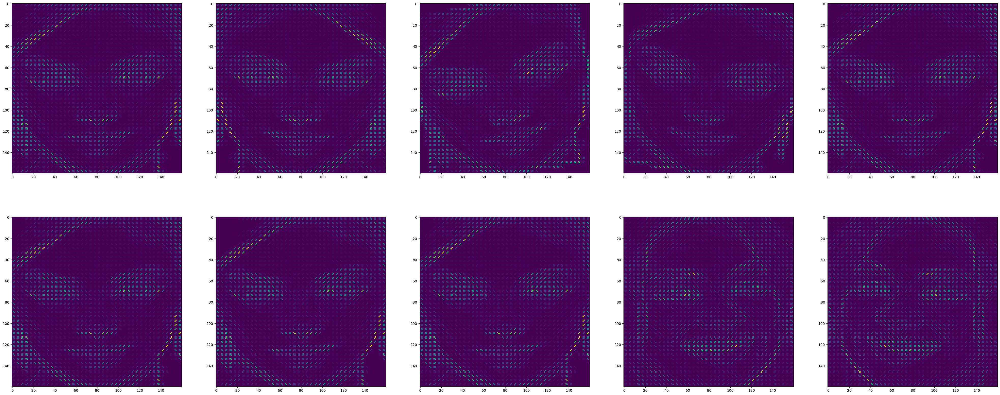

In [31]:
plot_image_sequence(train_features['img'], n = 10, imgs_per_row=5)

Now we are ready to submit our baseline

In [ ]:
hog_test = hog_extractor(test_X)
z_test = np.stack(hog_test['z'])
test_pred = clf.predict(z_test)

## competition submission: 
submission_df = pd.DataFrame({
    'id': range(len(test_pred)),
    'class': test_pred
})
# submission_df.to_csv('0402_hog_submission.csv', index = False)

This evaluates to **0.75 accuracy** on the test set

### 1.1.1. t-SNE Plots

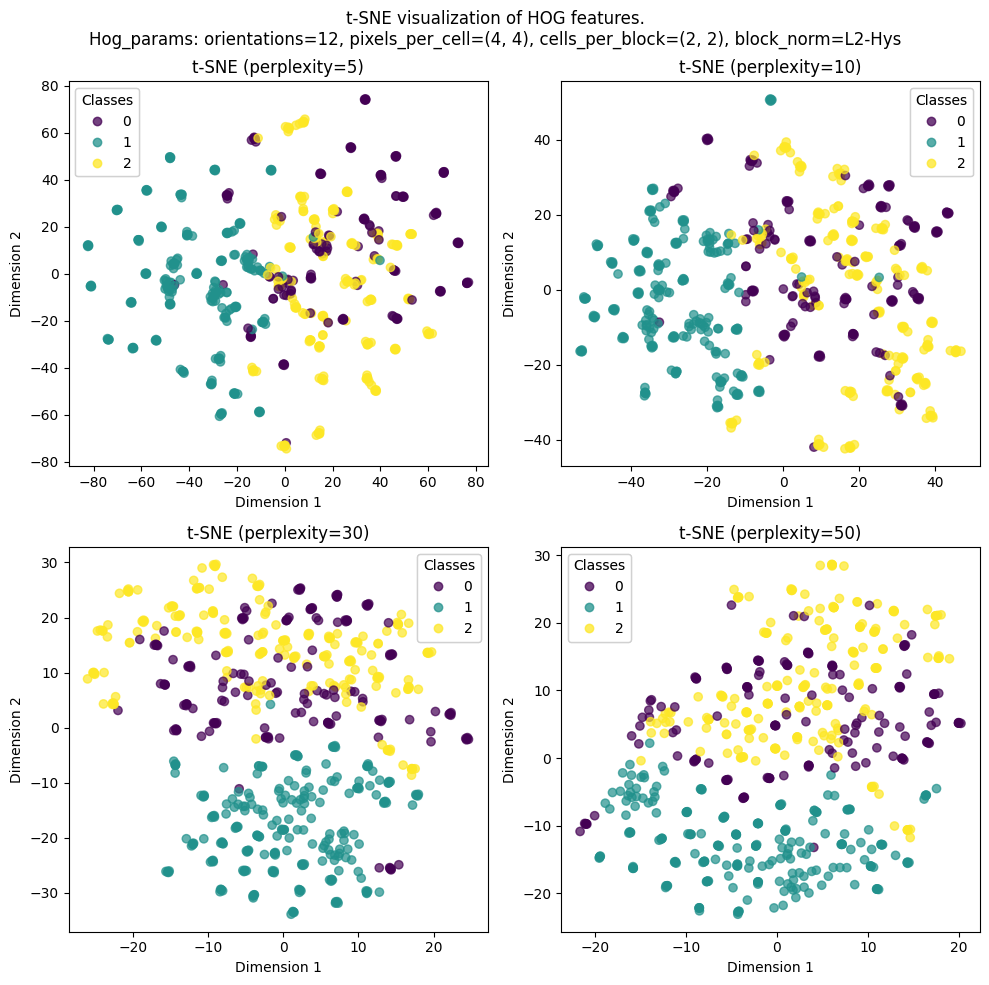

In [32]:
use_mask = False # If true the class zero is not shown in the plot 
mask = train_y_full != 0 
hog_features = zz[mask] if use_mask else zz
labels = train_y_full[mask] if use_mask else train_y_full
hog_params_str = ", ".join([f"{k}={v}" for k, v in bhog.items()  if k != 'visualize'])
perplexity_values = [5, 10, 30, 50]

n_cols = 2
n_rows = int(np.ceil(len(perplexity_values) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
axes = axes.flatten()  

for i, perplexity in enumerate(perplexity_values):
    tsne_params = {'perplexity': perplexity}
    tsne = TSNE(n_components=2, random_state=42, **tsne_params)
    X_2d = tsne.fit_transform(hog_features)  
    
    scatter = axes[i].scatter(X_2d[:, 0], X_2d[:, 1], c=labels, alpha=0.7)
    
    # Create legend for the current subplot
    legend = axes[i].legend(*scatter.legend_elements(), title="Classes")
    axes[i].add_artist(legend)
    
    axes[i].set_title(f"t-SNE (perplexity={perplexity})")
    axes[i].set_xlabel("Dimension 1")
    axes[i].set_ylabel("Dimension 2")

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle(f"t-SNE visualization of HOG features.\nHog_params: {hog_params_str}")
plt.tight_layout()
plt.show()


In general,  we observe that the 2D features learned by the t-SNE cluster separately class 1 and 2, which means that they are correctly separated on the high-dimensional space. However, it doesn't do a good job separating the "look-alikes" class.  


Perplexity can be thought of as a measure of the effective number of neighbours that each point considers in the high-dimensional space.

Under the hood, t-SNE uses a gaussian distribution around each point in the original feature space. Perplexity determines the std of this gaussian, balancing how strongly each point "looks" to its neighbours.

Low perplexity translates to a smaller std, so points only consider the closest neighbours as relevant. This highlights very detailed structures but might fragment the overall picture.
In contrast, high perplexity allows to capture a slightly more global context, at the cost of smoothing local details of the structure.

In short, perplexity controls the number of neighbouring points that each point "talks to". As perplexity changes, we observe that points in the 2d space are shifted around, and they do it in a way that reflects the changes in the gaussian std in the high-dimensional space. 


### 1.2 Discussion
**How does this feature compare to your previous grabbing task in the individual assignment?**

In the grabbing task of assignment one we work directly on the images, and compute a mask with a threshold in order to filter the target colors of the object.  **This is image segmentation but not feature extraction**. In feature extraction, we are interested in capturing a descriptive representation to be used in a downstream task such as classification.

**Did you need specific pre-processing steps before computing these feature descriptors on your images (which ones and why)?**

The processing step usually applied to the images before applying HOG is transforming the image to gray values. The reason for this is that a gray image has sufficient information to work with the gradients, and extracting HOG  features for each channel separately would result in storing redundant descriptive info.

## 1.2. Learning features from data: PCA feature extractor

### Understanding PCA 

**Principal Component Analysis (PCA)** is a technique for reducing the dimensionality of high-dimensional data while preserving as much of its variance (information) as possible. In face recognition, PCA identifies a small number of directions (called **principal components**) that capture the major differences across faces — these are known as **eigenfaces**.


#### Mathematical Formulation

Let the dataset be a matrix of centered samples:

- $X \in \mathbb{R}^{n \times d}$ where:
  - $n$ is the number of samples (images),
  - $d$ is the number of features (pixels per image).

**Steps of PCA:**

1. **Mean subtraction (centering):**  
   Compute the mean image:  
   $$
   \mu = \frac{1}{n} \sum_{i=1}^{n} x_i
   $$  
   Center the data:  
   $$
   X_{\text{centered}} = X - \mu
   $$

2. **Covariance matrix:**  
   $$
   \Sigma = \frac{1}{n - 1} X_{\text{centered}}^\top X_{\text{centered}}
   $$

3. **Eigen decomposition (or SVD):**  
   Compute eigenvectors $u_1, u_2, \dots, u_k$ and corresponding eigenvalues $\lambda_1, \dots, \lambda_k$ of $\Sigma$.

4. **Projection onto the principal component subspace:**  
   $$
   z_i = U_k^\top (x_i - \mu)
   $$  
   where $U_k = [u_1\ u_2\ \dots\ u_k]$ contains the top $k$ eigenvectors.

5. **Reconstruction:**  
   $$
   \hat{x}_i = \mu + U_k z_i
   $$

#### Use of PCA in Face Recognition

As shown in the course slides, face images, despite having thousands of pixels, often lie near a **low-dimensional subspace**. PCA helps:

- Capture important variations (identity, pose, lighting),
- Remove noise and redundancy,
- Enable faster and more accurate classification,
- Reduce memory and computational costs.

This forms the basis of the **eigenfaces approach** used for face recognition.

In [11]:
from sklearn.decomposition import PCA
import numpy as np

class IdentityFeatureExtractor:
    """A simple function that returns the input"""
    
    def transform(self, X):
        return X
    
    def __call__(self, X):
        return self.transform(X)

class PCAFeatureExtractor(IdentityFeatureExtractor):
    """Feature extractor using PCA"""

    def __init__(self, n_components):
        self.n_components = n_components
        self.pca = PCA(n_components=n_components)
        self.mean = None  # to store the mean image

    def fit(self, X):
        """
        Fit PCA on the dataset X.
        X: numpy array of shape (n_samples, n_features)
        """
        self.mean = np.mean(X, axis=0)
        X_centered = X - self.mean
        self.pca.fit(X_centered)
        return self

    def transform(self, X):
        """
        Project X onto the top principal components.
        X: numpy array of shape (n_samples, n_features)
        """
        X_centered = X - self.mean
        return self.pca.transform(X_centered)

    def inverse_transform(self, X_transformed):
        """
        Reconstruct data from PCA features.
        X_transformed: numpy array of shape (n_samples, n_components)
        """
        X_reconstructed = self.pca.inverse_transform(X_transformed)
        return X_reconstructed + self.mean

### Components sweep - Optimal number (p) of principal components



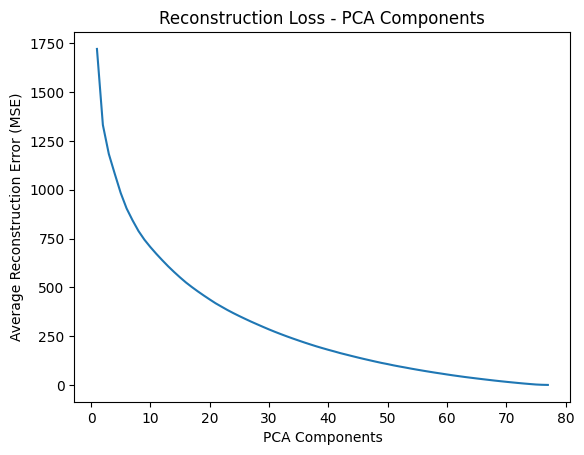

In [12]:
import cv2

# Convert RGB images to grayscale 
def rgb_to_gray(images):
    return np.array([cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_RGB2GRAY) for img in images])

X_gray = rgb_to_gray(train_X)  

# Flatten images to a 1D vector 
X_flat = X_gray.reshape((X_gray.shape[0], -1))  

errors = []
components = list(range(1, X_flat.shape[0]))  
for p in components:
    pca_extractor = PCAFeatureExtractor(n_components=p)
    pca_extractor.fit(X_flat)
    recon = pca_extractor.inverse_transform(pca_extractor.transform(X_flat))
    mse = np.mean((X_flat - recon) ** 2)
    errors.append(mse)

plt.plot(components, errors)
plt.xlabel("PCA Components")
plt.ylabel("Average Reconstruction Error (MSE)")
plt.title("Reconstruction Loss - PCA Components")
plt.show()

To determine an appropriate number of principal components, we evaluated the average reconstruction error (mean squared error) across a range of PCA component counts from 1 to 79.

The resulting curve shows a characteristic "elbow" shape. We observe that:

- **1 - 50 Components:** There is a significant drop in the loss, indicating that the first few components capture the most significant sources of variation in the face data (facial structure, pose, etc).
- **\> 50 components:** The curve gradually flattens, meaning that additional components contribute less to the reconstruction of the original images.

Thus, we selected **$p = 50$** as the optimal number of components, because it offers a strong balance between **dimensionality reduction**, **information retention** and **noise suppression**.

### Optimal number (p) of principal components based on Variance

In [13]:
# Flatten the grayscale images
X_flat = X_gray.reshape((X_gray.shape[0], -1))

# Required portion of variance to retain
variance = 0.95

pca_extractor = PCAFeatureExtractor(n_components=variance)
pca_extractor.fit(X_flat)
X_pca_95 = pca_extractor.transform(X_flat)

# Print the optimal number of components selected
print(f"Optimal number of components to retain {variance*100:.0f}% variance:", pca_extractor.pca.n_components_)

Optimal number of components to retain 95% variance: 50


To validate our manually selected value of $p = 50$, we also applied PCA using a variance-based criterion. Specifically, we instructed the model to retain **95% of the variance** in the data, allowing it to automatically determine the optimal number of components. As a result, PCA selected exactly **50 components**, which matches our earlier choice based on the reconstruction loss curve.

This agreement between two independent strategies, one based on visualizing reconstruction error, and the other on explained variance, strongly supports our selection of $p = 50$ as a well-balanced, data-driven dimensionality cutoff.

It ensures that we:
- **Preserve most of the meaningful structure** in the facial images,
- **Discard less informative and noisy variation**,
- And **reduce the feature** space for more efficient and effective classification.

### Project to PCA Feature Space

In [14]:
# Use the selected number of components
p_optimal = 50

# Re-fit PCA with the optimal number of components
pca_extractor = PCAFeatureExtractor(n_components=p_optimal)
pca_extractor.fit(X_flat)

# Project the original images into the PCA space
X_pca = pca_extractor.transform(X_flat)  

print("Projected PCA feature shape:", X_pca.shape)

Projected PCA feature shape: (78, 50)


### Number of non-zero eigenvalues / singular values

In [15]:
eigenvalues = pca_extractor.pca.explained_variance_
nonzero_eigenvalues = np.sum(eigenvalues > 1e-10)

print("Non-zero eigenvalues:", nonzero_eigenvalues)
print("Total eigenvalues:", len(eigenvalues))

Non-zero eigenvalues: 50
Total eigenvalues: 50


### 1.2.1. Eigenface Reconstructions


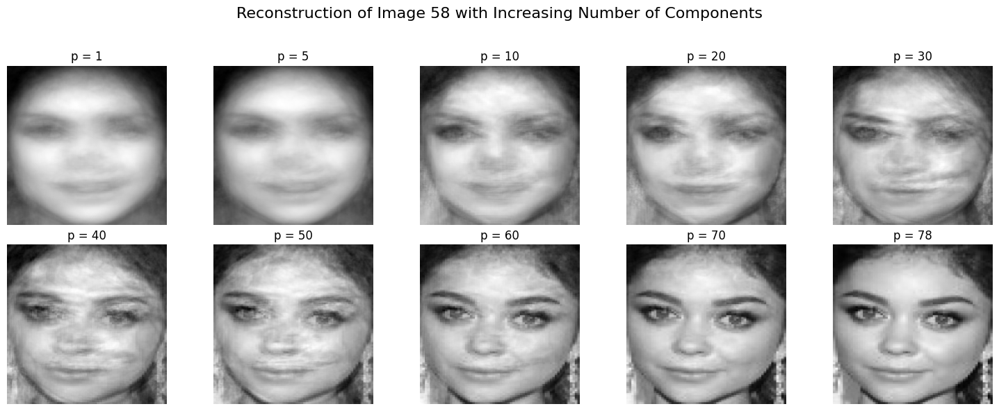

In [17]:
# Get the original index of the image we retrieved
image_idx = np.where(train_y == 0)[0][15] 

# List of components 
p_values = [1, 5, 10, 20, 30, 40, 50, 60, 70, 78]

fig, axs = plt.subplots(2, 5, figsize=(15, 6))
fig.suptitle(f"Reconstruction of Image {image_idx} with Increasing Number of Components", fontsize=16)

for i, p in enumerate(p_values):
    pca_extractor = PCAFeatureExtractor(n_components=p)
    pca_extractor.fit(X_flat)
    
    # Reconstruct the single image
    X_pca = pca_extractor.transform(X_flat[[image_idx]])
    X_reconstr = pca_extractor.inverse_transform(X_pca).reshape(X_gray.shape[1], X_gray.shape[2])
    
    ax = axs[i//5, i%5]
    ax.imshow(X_reconstr, cmap='gray')
    ax.set_title(f"p = {p}")
    ax.axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

We reconstructed Image 59 (**Sarah_Hyland**), which we were able to retrieve thanks to our DNN model. We used different numbers of principal components, ranging from 1 to 79. As the number of components increases, the reconstruction quality improves dramatically, both visually and structurally:

- **1 to 30 components**: The reconstructions are highly blurred and lack key facial details. 
- **40 to 50 components**: The overall face structure becomes clearly recognizable (eyes, mouth, hairline).
- **60 to 70 components**: Finer details start to appear, like shadows and facial features.
- **Above 70 components**: Reconstructions are almost identical to the original.

This reconstruction process supports our choice of **$p = 50$** for the number of components as it preserves the key visual information needed for analysis while keeping the feature space compact and avoiding unnecessary complexity.  
Before applying PCA, the images were preprocessed by detecting and cropping the face region, converting to grayscale, resizing to a fixed shape, and flattening into vectors. These steps ensured consistent input and made the data suitable for reconstruction and analysis. At the same time, the reconstruction results show that the principal components capture robust and discriminative features, progressing from global structure to fine detail.

### 1.2.2. Feature Space Plots

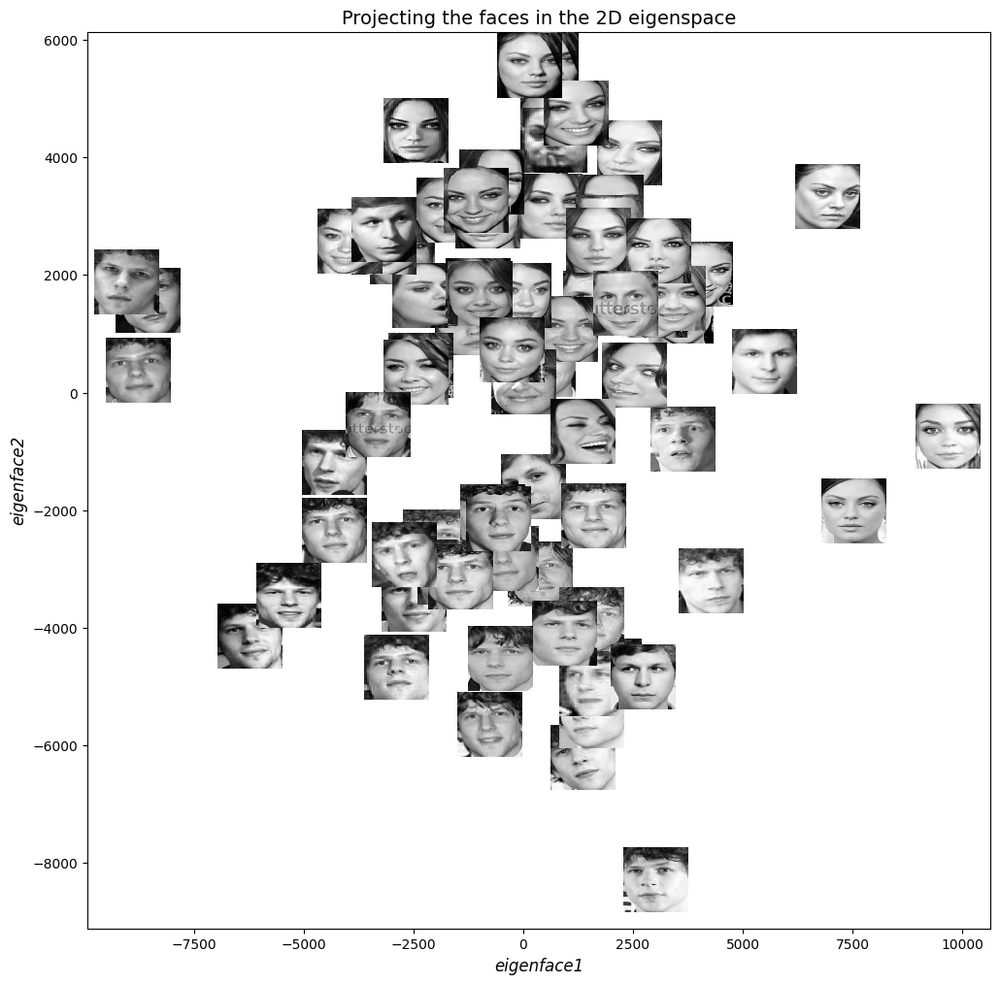

In [18]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import matplotlib.pyplot as plt

X_flat = X_gray.reshape((X_gray.shape[0], -1))

pca_extractor_2d = PCAFeatureExtractor(n_components=2)
pca_extractor_2d.fit(X_flat)
X_pca_2d = pca_extractor_2d.transform(X_flat)

fig, ax = plt.subplots(figsize=(12, 12))
for (x, y), img in zip(X_pca_2d, X_gray):
    ab = AnnotationBbox(
        OffsetImage(img, zoom=0.3, cmap='gray'),
        (x, y),
        xycoords='data',
        boxcoords='data',
        pad=0,
        frameon=False,
    )
    ax.add_artist(ab)

# Get the values of each principal component separately
pc1 = X_pca_2d[:, 0]
pc2 = X_pca_2d[:, 1]
# Adjust axis limits to fit all images
margin = 0.1
ax.set_xlim(pc1.min() - margin * abs(pc1.min()),
            pc1.max() + margin * abs(pc1.max()))
ax.set_ylim(pc2.min() - margin * abs(pc2.min()),
            pc2.max() + margin * abs(pc2.max()))

ax.set_title("Projecting the faces in the 2D eigenspace", fontsize=14)
ax.set_xlabel("eigenface1", fontsize=12, style='italic')
ax.set_ylabel("eigenface2", fontsize=12, style='italic')

plt.show()

We applied PCA to project the face dataset into a 2D eigenspace defined by its first two principal components. Each image is visualized at its corresponding position using its grayscale thumbnail, giving an interpretable view of how facial variation is captured in the feature space.

Thanks to the improved face detection using our DNN-based model, the input data is now significantly cleaner and more consistent. Previously problematic cases, such as completely black images or misaligned crops, have been eliminated. As a result, the PCA projection appears much more structured and balanced.

One particularly striking observation is the symmetry along the first principal component (x-axis), with values ranging roughly from -8000 to +8000. This suggests that the main direction of variance is evenly distributed across the dataset, a strong indicator of well-centered, properly preprocessed data.

We also see the emergence of semantically meaningful clusters:
- Images of **Jesse Eisenberg** and **Michael Cera** appear grouped on the left side of the plot, reinforcing their visual similarity.
- On the right, **Mila Kunis** and **Sarah Hyland** form a tight cluster, again reflecting real-world confusion between their appearances.

Beyond identity separation, additional insights can be drawn:
- The **first principal component** (x-axis) seems to capture the dominant variation in identity, roughly separating male and female faces, or Jesse/Michael vs Mila/Sarah.
- The **second principal component** (y-axis) likely reflects more subtle differences such as facial expression, pose, or lighting, as evidenced by vertical spread within each cluster.

The center of the plot is particularly dense, especially among Mila and Sarah images, suggesting overlapping feature representations. This is expected given the high visual similarity between those individuals and poses challenges for linear separation.

While most images fall into coherent groups, a few outliers still appear on the periphery. These may be due to less typical expressions, residual variation in face detection, or simply samples that are harder to compress accurately in two dimensions.

In summary, this PCA feature space offers a powerful visual summary of the data’s structure. It confirms that principal components are capable of capturing both broad identity-level variation and finer visual details. When paired with robust face detection and preprocessing, PCA yields a low-dimensional representation that is not only compact and discriminative but also human-interpretable.


### 1.2.3. Discussion

#### 1. How to convert my image dataset to a 2D matrix?

Each RGB image is first converted to grayscale, resulting in images of shape (140, 140). These are then flattened to 1D vectors of length 19600. This gives us a 2D matrix of shape (79, 19600), where each row is a flattened image.

#### 2. Can you exploit the dimensionality of this data matrix to make your computations more effective?

Yes. Since the number of samples (79) is much smaller than the number of features (19600), we can take advantage of this by computing principal components in a way that avoids directly working with the full high-dimensional [DxD] covariance matrix -- **using SVD rather than eigenvalue decomposition**. This makes the computations more efficient and allows us to extract the most important patterns in the data without being slowed down by the large number of pixels.

#### 3. Mean subtraction or not?

Yes, mean subtraction is essential. We subtract the mean image (computed across all training samples) from each individual image before applying PCA. This centers the data around the origin, which is a crucial step for PCA to correctly identify the directions of maximum variance in the dataset.

#### 4. Shall we use eigenvalue or singular value decomposition?

We use Singular Value Decomposition (SVD), which is the method employed by `sklearn.PCA`. SVD is more numerically stable and better suited for high-dimensional datasets, particularly when the number of features is much greater than the number of samples.

#### 5. How many non-zero eigenvalues/singular values should we have?

In PCA, we analyze the directions of maximum variance in the data by decomposing the centered data matrix $X \in \mathbb{R}^{n \times d}$, where:
- $n$ is the number of samples (images),
- $d$ is the number of features (pixels per image).

After subtracting the mean from the data (to center it), the matrix $X$ has a maximum rank of $n - 1$. This limits the number of meaningful directions (components) we can extract:

- The number of **non-zero singular values** is at most $\min(n, d)$,
- The number of **non-zero eigenvalues** is at most $\min(n - 1, d)$.

This is because PCA is based on the covariance matrix, whose rank cannot exceed the number of centered samples minus one.

In our problem:
- $n = 79$ samples,
- $d = 19600$ features,
- So we expect:
  - Up to **79** singular values,
  - Up to **78** non-zero eigenvalues.

However, we apply PCA with a predefined number of components ($p = 50$). In this case, the model retains only the top $p$ eigenvalues and their corresponding components. 

In this case:
- $p = 50$ components,
- $d = 19600$ features,
- So we retain:
  - The top **50** non-zero eigenvalues.

### 1.2.4 PCA Feature Extraction

In [21]:
# List of components 
p_values = [1, 5, 10, 20, 30, 40, 50, 60, 70, 78]

# Define the directory
directory = "pca_features"

# Create the directory if it doesn't exist
os.makedirs(directory, exist_ok=True)

for p in p_values:
    X_gray = rgb_to_gray(train_X)  
    X_flat = X_gray.reshape((X_gray.shape[0], -1))  

    pca_extractor = PCAFeatureExtractor(n_components=p)
    pca_extractor.fit(X_flat)

    X_train_pca = pca_extractor.transform(X_flat)  
    
    X_test_gray = rgb_to_gray(test_X)   
    X_test_flat = X_test_gray.reshape((X_test_gray.shape[0], -1))  

    X_test_pca = pca_extractor.transform(X_test_flat)
    
    np.save(f"pca_features/X_train_pca_{p}_components.npy", X_train_pca)
    np.save(f"pca_features/X_test_pca_{p}_components.npy", X_test_pca)

### How well does PCA perform? 

Note that for PCA we are not introducing data augmentation, as these artificial variations would be learned as principal components, and compete with the true variations of the data distribution that we want to learn. 

In [22]:
clfPCA = SVC(kernel='linear', probability=True, random_state=42)
clfPCA.fit(X_train_pca, train_y)
test_pred = clfPCA.predict(X_test_pca)

# submission_df.to_csv('0402_00_pca_submission.csv', index = False)

The SVM trained on PCA features evaluate to **0.65 accuracy on the test set**. Next, we can try to combine them with HOG predictions to see how well do they perform jointly.

### How do the combined predictions of HOG and PCA perform?

To combine the predictions we are training an SVM classifier for each sets of features, and add their probabilities as a weighted sum. This "soft voting" usually works really well, combining the strenghts of each classifer while reducing their individual weaknesses.

In [30]:
#### HOG classifiers 

hog_paramTop1 = {'pixels_per_cell': 8, 'orientations': 12, 'cells_per_block': 2, 'mean_cv_accuracy': 0.8608333333333335, 'features_num': 12288}
hog_paramTop2 = {'pixels_per_cell': 8, 'orientations': 6, 'cells_per_block': 2, 'mean_cv_accuracy': 0.8483333333333334, 'features_num': 6144}

def getHogExtractor(hog_params):
    bhog = {
        'orientations': hog_params['orientations'],
        'pixels_per_cell': (hog_params['pixels_per_cell'], hog_params['pixels_per_cell']),
        'cells_per_block': (hog_params['cells_per_block'], hog_params['cells_per_block']),
        'block_norm': 'L2-Hys',
        'visualize': True,
    }
    return HOGFeatureExtractor(**bhog)

hog_ex1 = getHogExtractor(hog_paramTop1)
hog_ex2 = getHogExtractor(hog_paramTop2)
zz1 = np.stack(hog_ex1(train_x_full)['z'])
zz2 = np.stack(hog_ex2(train_x_full)['z'])

clfHog1 = SVC(kernel='linear', probability=True, random_state=42)
clfHog1.fit(zz1, train_y_full)

clfHog2 = SVC(kernel='linear', probability=True, random_state=42)
clfHog2.fit(zz2, train_y_full)

SVC(kernel='linear', probability=True, random_state=42)

In [31]:
# hog predictions
ztest1 = np.stack(hog_ex1(test_X)['z'])
probsHog1 = clfHog1.predict_proba(ztest1)
ztest2 = np.stack(hog_ex2(test_X)['z']) 
probsHog2 = clfHog2.predict_proba(ztest2)

# pca predictions 
probspca = clfPCA.predict_proba(X_test_pca)

alphas = [.33, .33, .34]
probs_pred = [probsHog1, probsHog2, probspca]

probs_wsum = np.sum([w * p for w,p in zip(alphas, probs_pred)], axis = 0)
submission_df = pd.DataFrame({ 'id': range(len(probs_wsum)), 'class':  probs_wsum.argmax(axis = -1)})
# submission_df.to_csv('0403_01_2hogAndPCA_submission.csv', index = False) 


This evaluates to **0.865 accuracy** on the test set, so we can get really far by using data augmentation and traditional feature descriptors. Later we will see how good are these features compared to features extracted from a pretrained deep network model. 

# 4. Improve performance

We have demonstrated that even with traditional features and a limited training set we have gone quite far regarding the accuracy on the test set. But of course 85% accuracy is not enough! Moreover, a computer vision project that doesn't incorporate a Deep Neural Network -- and needs 2 days of debugging --  is simply unacceptable. So let's try to improve our pipeline!

#### Issues identified
1. Just like the training set, the test set contains photos either with multiple target faces or no target faces at all! Multiple approaches will be taken to tackle this.
2. Traditional feature extraction is robust enough but nowadays the [state of the art achieves better than human performance](https://github.com/serengil/deepface?tab=readme-ov-file#:~:text=Experiments%20show%20that%20human%20beings%20have%2097.53%25%20accuracy%20on%20facial%20recognition%20tasks%20whereas%20those%20models%20already%20reached%20and%20passed%20that%20accuracy%20level. "Deepface Quote")!
3. We could always make stronger augmentations (up until a point ofc)

## 4.1 Baseline improvement

We will begin this section by introducing [Deepface](https://github.com/serengil/deepface "Deepface"), a comprehensive face recognition framework for python. It incorporates many state-of-the-art models such as VGG-Face and FaceNet as well as many backends, such as opencv, mtcnn, yolo and retinaface. Confused yet? Well, fear not because our team has prepped a 101 crash course for you!

## 4.1.1 The VGG Face

**VGG Face** is a deep neural network model for face recognition. Although the original research paper is titled *"Deep Face"*, the model is widely known as **VGG-Face**. It is deeper than Facebook’s Deep Face, boasting **22 layers** and **37 deep units**.

### <span style="color: #AF7AC5;">Model Architecture</span>

The structure of the VGG-Face model is similar to the standard VGG network, with modifications in the output layer to suit face recognition tasks.

For a detailed look at the model architecture, please refer to the following documents:
- [VGG-Face Poster](https://www.robots.ox.ac.uk/~vgg/publications/2015/Parkhi15/poster.pdf)
- [VGG-Face Original Paper](https://www.robots.ox.ac.uk/~vgg/publications/2015/Parkhi15/parkhi15.pdf)

Below is an example illustration of VGG-Face layers from the original paper:

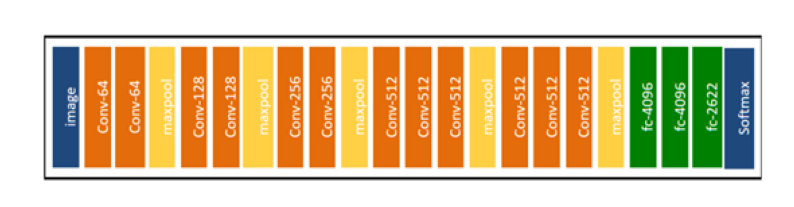

In [7]:

def view_img(img_name, shape=(10,6)): 
    img = Image.open(f'images/{img_name}')
    plt.figure(figsize=shape)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

view_img('1.png')

### <span style="color: #D35400;">Vector Similarity for Face Recognition</span>

VGG-Face encodes input images as high-dimensional vectors (embeddings). To compare two images, we compute the distance between their corresponding embeddings.

Two common distance metrics used are:
- **Cosine Distance**: Defined as *1 minus the cosine similarity*.  
- **Euclidean Distance**.

The principle is simple:
- **Small Distance:** Indicates that the two images represent the same person.
- **Large Distance:** Indicates that the images represent different people.

A threshold value (ε) is selected to decide whether two images belong to the same person. For more insights on fine-tuning this threshold, please read this [blog post](https://sefiks.com/2020/05/22/fine-tuning-the-threshold-in-face-recognition/).

### <span style="color: #27AE60;">One-Shot Learning Process and Face Verification</span>

The VGG-Face model is designed to work in a **one-shot learning** scenario. This means:

- **Single Image Storage:** We store one picture of a person in our database.
- **Real-Time Verification:** When a person arrives (e.g., at a building entrance), a new photo is captured and verified against the stored image.

This process is known as **face verification** rather than face recognition. In some research contexts, computing distances between image embeddings is also referred to as using **Siamese networks**.

### <span style="color: #C0392B;">Testing VGG-Face</span>

In our tests, we experimented with images of celebrities such as **<span style="color: #2980B9;">Angelina Jolie</span>**, **<span style="color: #27AE60;">Jennifer Aniston</span>** and **<span style="color: #F39C12;">Katy Perry</span>** (<em>The system was not [Hot and Cold](https://www.youtube.com/watch?v=kTHNpusq654&pp=ygUMSG90IGFuZCBjb2xk) :)</em>).

Even when <span style="color: #2980B9;">Angelina Jolie</span> appears in different forms or even when <span style="color: #F39C12;">Katy Perry</span> is literally unrecognizable, the model still delivers!





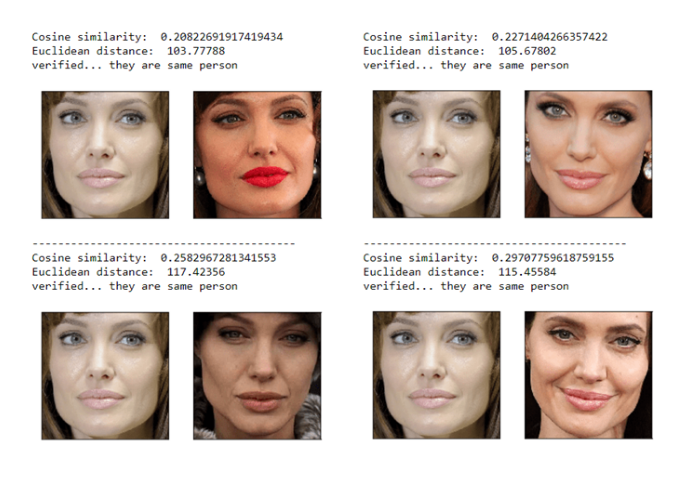

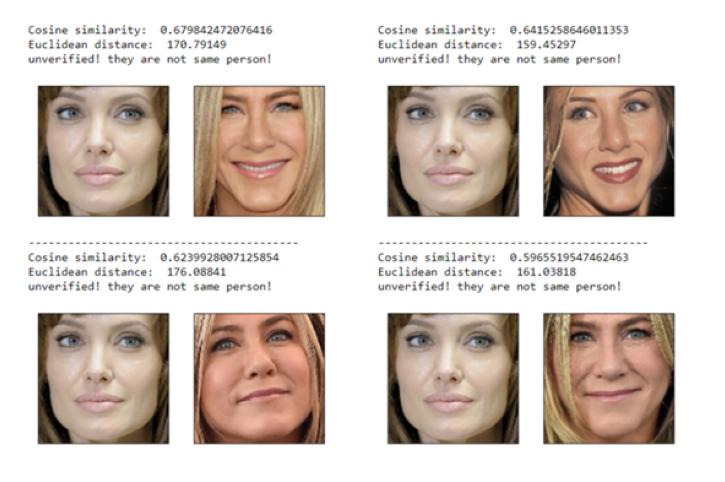

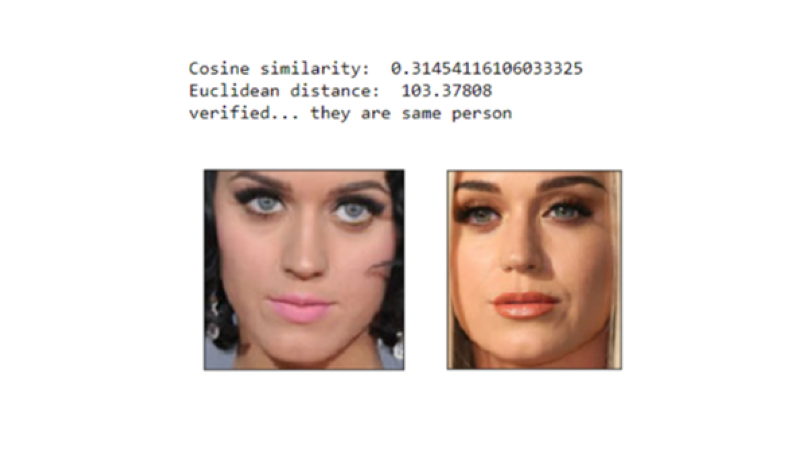

In [9]:
view_img('3.png')
view_img('4.png')
view_img('5.png')

## 4.1.2 The FaceNet512

**FaceNet512** ισ a deep neural network model for face recognition that extends the original FaceNet architecture by extracting 512-dimensional embeddings.

### <span style="color: #2471A3;">Model Architecture</span>

FaceNet512 employs a deep convolutional neural network designed to produce highly discriminative 512-dimensional embeddings for face images. Here are some key points:

- **High-Dimensional Embeddings:**  
  The network maps face images into a 512-dimensional Euclidean space. In this space, similar faces are close together, while dissimilar faces are far apart.

- **Deep Convolutional Layers:**  
  Inspired by architectures such as Inception and ResNet, FaceNet512 uses multiple convolutional layers to learn both low-level and high-level features from face images.

- **Modified Output Layer:**  
  Unlike models designed for general image classification, the final layer of FaceNet512 is tuned to produce embeddings rather than class probabilities.

For a deeper understanding of the architecture, you may refer to the original FaceNet paper:
- [FaceNet: A Unified Embedding for Face Recognition and Clustering](https://arxiv.org/abs/1503.03832)

### <span style="color: #229954;">Training with Triplet Loss</span>

One of the core innovations of FaceNet is the use of **triplet loss** during training. The training process involves:

- **Triplet Selection:**  
  Each training example consists of three images:
  - **Anchor:** The reference image.
  - **Positive:** An image of the same person as the anchor.
  - **Negative:** An image of a different person.
  
- **Loss Objective:**  
  The goal is to ensure that the distance between the anchor and the positive embedding is smaller than the distance between the anchor and the negative embedding by a margin. This encourages the network to cluster images of the same person closer together while pushing images of different people further apart.

This training strategy leads to a highly effective embedding space where distances are semantically meaningful.

### <span style="color: #CA6F1E;">Preprocessing and Alignment</span>

Before feeding images into FaceNet512, proper preprocessing is essential:
- **Face Alignment:**  
  Faces are typically aligned using facial landmarks (eyes, nose, mouth) so that the key features are in consistent positions.
- **Normalization:**  
  Images are normalized (resized, scaled, etc.) to match the input requirements of the network, ensuring robust feature extraction.

### <span style="color: #AF7AC5;">Vector Similarity & Verification</span>

FaceNet512 converts images into 512-dimensional embeddings. The similarity between two face images is computed by comparing their embeddings, typically using:
- **Cosine Similarity:** Measures the cosine of the angle between two vectors.
- **Euclidean Distance:** Measures the straight-line distance in the embedding space.

A threshold is chosen to decide whether two images belong to the same person. If the distance is below the threshold (or the cosine similarity is above a certain value), the images are considered a match.

> **Note:** Tuning the threshold is critical and may require experimentation based on the specific dataset and application.

### <span style="color: #D35400;">Testing FaceNet512</span>

When testing FaceNet512, you'll observe that the model is robust to variations in lighting, pose, and even occlusions. For example:
- The model successfully verifies identities even when the subject's appearance changes significantly.
- In practice, FaceNet512 has shown excellent performance on benchmark datasets for face recognition.

### <span style="color: #117A65;">Summary</span>

- **High-Dimensional Embedding:** FaceNet512 produces 512-dimensional vectors that capture the unique features of a face.
- **Robust Feature Learning:** The deep convolutional architecture combined with triplet loss ensures that embeddings are both discriminative and robust to variations.
- **Practical Applications:** Ideal for face verification and identification tasks in real-world scenarios.
- **End-to-End Pipeline:** Integrates preprocessing, embedding extraction and similarity comparison into a cohesive system.

FaceNet512 represents a significant step forward in face recognition technology, offering high accuracy and robustness even under challenging conditions.



<h2 style="color: #884EA0;">Finding Similarity</h2>

Once embeddings are generated from images, similarity between two face images can be computed. While many approaches use cosine similarity, the researchers in the FaceNet study found that using **Euclidean distance** worked well to determine how similar two embeddings are.

**Euclidean Distance** measures the straight-line distance between two points in the embedding space. In FaceNet, if two images are of the same person, the Euclidean distance between their embeddings should be small. Conversely, if they are of different people, the distance will be larger.

<h2 style="color: #CB4335; text-shadow: 1px 1px 2px #ccc;">Introducing Threshold Determination + Similarity</h2>

<p style="font-size: 16px; color: #34495E; margin-bottom: 10px;">
If you wonder how to determine the threshold value for this face recognition model, then this blog post explains it deeply:
<a href="https://sefiks.com/2020/05/22/fine-tuning-the-threshold-in-face-recognition/" target="_blank" style="color: #2980B9; font-weight: bold;">Fine-Tuning the Threshold in Face Recognition</a>.
</p>

## 4.1.3 RetinaFace - Used for Face Detection

<h2 style="color: #27AE60;">About RetinaFace</h2>

<p style="font-size: 16px; color: #34495E;">
RetinaFace is based on the academic study 
<a href="https://arxiv.org/abs/1905.00641" target="_blank" style="color: #E74C3C; font-weight: bold;">"RetinaFace: Single-stage Dense Face Localisation in the Wild"</a>.

</p>

<p style="font-size: 16px; color: #34495E;">
The original work uses a <strong>ResNet152</strong> backbone, but the TensorFlow re-implementation available in this notebook uses a <strong>ResNet50</strong> backbone for improved speed and efficiency.
</p>


<h2 style="color: #27AE60; text-shadow: 1px 1px 2px #ccc;">Face Detection</h2>

<p style="font-size: 16px; color: #34495E; line-height: 1.6;">
Retinaface expects an exact image path (or a NumPy array) and returns a JSON-like dictionary containing details such as detection score, facial area, and facial landmarks.
</p>

<p style="font-size: 16px; color: #34495E; line-height: 1.6;">
For example, the output might look like:
</p>

<pre style="background-color: #FDFEFE; padding: 15px; border: 1px solid #D5D8DC; border-radius: 8px; font-size: 14px; line-height: 1.6;">
{
    "face_1": {
        "score": 0.9993440508842468,
        "facial_area": [155, 81, 434, 443],
        "landmarks": {
          "right_eye": [257.82974, 209.64787],
          "left_eye": [374.93427, 251.78687],
          "nose": [303.4773, 299.91144],
          "mouth_right": [228.37329, 338.73193],
          "mouth_left": [320.21982, 374.58798]
        }
    }
}
</pre>

<h2 style="color: #27AE60; text-shadow: 1px 1px 2px #ccc;">Face Alignment</h2>

<p style="font-size: 16px; color: #34495E; line-height: 1.6;">
Notice that the detected landmarks include eye coordinates. By aligning the faces so that the eyes become horizontal, we can improve face recognition accuracy by almost 1%. The RetinaFace framework offers a custom function to extract faces. This function accepts an exact image path or a NumPy array, and it returns the detected face(s) with alignment applied by default. You can turn this feature off by setting the <code>align</code> argument to <code>False</code>.
</p>


#### Example of a face getting recognized and aligned

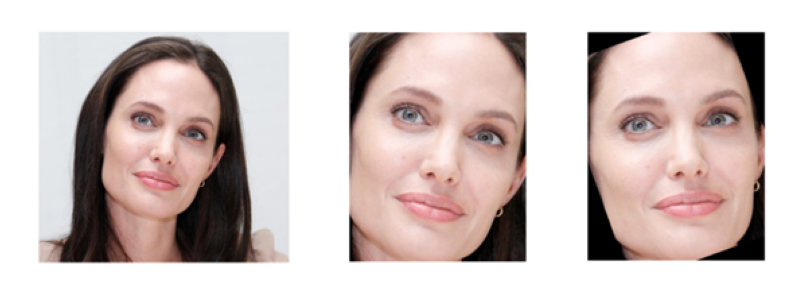

In [10]:
view_img('6.png')

## 4.1.4 Albumentations - used for strong augmentations

Albumentations is a fast and flexible image augmentation library for deep learning, particularly optimized for computer vision tasks. It provides a wide variety of augmentations (over 70 different transformations) while maintaining high performance due to its optimized backend.

**Key Augmentations Applied:**
1. Geometric Transformations:
    - HorizontalFlip (50% chance) – Simulates mirrored images.
    - Rotate (up to 60° with reflection padding) – Adds rotational variance.
    - ShiftScaleRotate – Combines slight shifts, scaling, and rotation.

2. Color & Contrast Adjustments:
    - RandomBrightnessContrast (±20% brightness/contrast) – Adapts to lighting variations.
    - CLAHE (Contrast Limited Adaptive Histogram Equalization) – Enhances local contrast.
    - ColorJitter – Randomizes brightness, contrast, saturation, and hue.

3. Noise and Blur Effects:
    - GaussNoise (variance: 10–50) – Simulates sensor noise.
    - Blur (max kernel size: 3) – Mild smoothing for robustness.

**Why This Pipeline?**

- Diversity: Covers spatial, color, and noise-based augmentations.
- Realism: BORDER_REFLECT in rotations avoids artificial edges.

### And that's a wrap for our crash course! We hope you enjoyed it. now let's get some serious results

## 4.2 The real deal

### 4.2.1 Define augmentation pipeline

In [ ]:
def strong_augmentations():
    return A.Compose([
            A.HorizontalFlip(p=0.5),
            A.Rotate(limit=60, p=0.7, border_mode=cv2.BORDER_REFLECT),
            A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.7),
            A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=0.5),
            A.GaussNoise(var_limit=(10.0, 50.0), p=0.5),
            A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.5),
            A.Blur(blur_limit=3, p=0.1),
            A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, p=0.5),
        ], p=1)

def albu_augment_data(X, y, multiplier=8):
    aug = strong_augmentations()
    augmented = [X.copy()]
    labels = [y.copy()]
    
    # Determine if images are already normalized (values between 0-1)
    is_normalized = X.max() <= 1.0
    
    for _ in range(multiplier):
        batch = []
        for img in X:
            # Convert to uint8 for augmentation if normalized
            if is_normalized:
                img_for_aug = (img * 255).astype(np.uint8)
            else:
                img_for_aug = img.astype(np.uint8)
            
            # Apply augmentation
            transformed = aug(image=img_for_aug)["image"]
            
            # Convert back to original format
            if is_normalized:
                transformed = transformed.astype(np.float32) / 255.0
                
            batch.append(transformed)

        augmented_batch = np.array(batch)
        augmented.append(augmented_batch)
        labels.append(y)
    
    return np.concatenate(augmented), np.concatenate(labels)

Now let's define our main pipeline. Looks basic but it's powerful! Also to avoid the kernel crashing out of memory we implement a data generator, in order to read each image from disk one by one. If you have already [downloaded more ram](https://downloadmoreram.com/) you can simply load and iterate through the test set.

In [ ]:
# Define a generator to read test images one by one.
def test_image_generator(csv_path='data/test_set.csv', images_folder='data/test'):
    # Read the CSV file with test IDs.
    test_df = pd.read_csv(csv_path, index_col=0)
    test_df.index = test_df.index.rename('id')
    for idx, row in test_df.iterrows():
        # Construct the file path and load the image from the .npy file.
        img_path = os.path.join(images_folder, f"test_{idx}.npy")
        # Convert the loaded image from BGR to RGB.
        img = cv2.cvtColor(np.load(img_path, allow_pickle=False), cv2.COLOR_BGR2RGB)
        yield idx, img

Also since we are going to use Retinaface as a backend to more robustly take face embeddings we will retake the train photos with a small twist; We will allow our DNNPreprocessor to have 20% more border around the detected faces so when we feed it into the deepface represent function the face will be more accurately cropped by the algorithm.

In [ ]:
# Updated class with border expansion 
class DNNPreprocessor():
    """
    Preprocessing pipeline built around opencv's DNN module Face Detection
    Uses provided methods from HAARPreprocessor and adapted detect_faces
    It can be used as a direct replacement to HAARPreprocessor
    """
    def __init__(self, face_size,
                 dnn_path,
                 config_path):
        self.face_size = face_size
        self.net = cv2.dnn.readNetFromCaffe(config_path, dnn_path)

    def detect_faces(self, frame, conf_threshold=0.5, expand_percent=20):
        # Get frame dimensions
        (h, w) = frame.shape[:2]

        # Preprocess the frame:
        # create a blob with mean subtraction as required by the model
        blob = cv2.dnn.blobFromImage(frame, 1.0, (300, 300),
                                     (104.0, 177.0, 123.0),
                                     swapRB=False, crop=False)

        # Get predictions from the network
        self.net.setInput(blob)
        detections = self.net.forward()

        faces = []
        # Loop over the detections
        for i in range(0, detections.shape[2]):
            confidence = detections[0, 0, i, 2]
            # Filter out weak detections based on the threshold
            if confidence > conf_threshold:
                # Compute the (x, y) coordinates of the bounding box
                box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
                (startx, starty, endx, endy) = box.astype("int")

                # Expand the bounding box by the specified percentage
                original_width = endx - startx
                original_height = endy - starty
                delta_x = original_width * expand_percent / 100
                delta_y = original_height * expand_percent / 100

                startx = int(startx - delta_x)
                starty = int(starty - delta_y)
                endx = int(endx + delta_x)
                endy = int(endy + delta_y)

                # Ensure coordinates stay within the frame
                startx = max(0, startx)
                starty = max(0, starty)
                endx = min(w, endx)
                endy = min(h, endy)

                faces.append([startx, starty, endx - startx, endy - starty])

        return faces

    def extract_faces(self, img):
        """Returns all faces (cropped) in an image."""

        faces = self.detect_faces(img)

        return [img[y:y+h, x:x+w] for (x, y, w, h) in faces]

    def preprocess(self, data_row):
        faces = self.extract_faces(data_row['img'])

        # if no faces were found, return None
        if len(faces) == 0:
            nan_img = np.empty(self.face_size + (3,))
            nan_img[:] = np.nan
            return nan_img

        # only return the first face
        return cv2.resize(faces[0], self.face_size,
                          interpolation=cv2.INTER_AREA)

    def __call__(self, data):
        return np.stack([self.preprocess(row) for _,
                         row in data.iterrows()]).astype(int)

In [ ]:
preprocessor = DNNPreprocessor(FACE_SIZE, dnn_path, config_path)
train_X, train_y = preprocessor(train), train['class'].values
train_y = train['class'].values
replace_face(0, 15)
replace_face(1, 8)
replace_face(1, 14)
replace_face(1, 18)
replace_face(1, 19)
replace_face(1, 20)
indices = np.nonzero(train_y == 2)[0]
problematic_index = indices[24]
train_X = np.delete(train_X, problematic_index, axis=0)
train_y = np.delete(train_y, problematic_index, axis=0)
problematic_index = indices[21]
train_X = np.delete(train_X, problematic_index, axis=0)
train_y = np.delete(train_y, problematic_index, axis=0)

In [ ]:
# Choose a model for face representation; here we use "VGG-Face", but you can also use FaceNet512 and all other from Deepface
model_name = "VGG-Face"
# Note: if yiu decide to use FaceNet embeddings you must also perform
# an L2 normalization of the train and test embeddings using the following;
# normalized_face_embedding = face_embedding / np.linalg.norm(face_embedding)

def get_embedding(image):
    """
    Given an image (numpy array), compute its embedding using DeepFace.
    The function assumes the face is already cropped.
    """
    rep = DeepFace.represent(img_path=image, model_name=model_name, enforce_detection=True)
    return rep[0]["embedding"]

# Precompute embeddings for the training images
print("Computing training embeddings...")
train_embeddings = [get_embedding(img) for img in train_X]
train_embeddings = np.array(train_embeddings)

results = []

print("Processing test images...")
test_gen = test_image_generator(csv_path='data/test_set.csv', images_folder='data/test')

# Process each test image one by one.
for idx, test_img in test_gen:
    vote_labels = []
    
    # Extract faces from the test image. 
    # This returns a list of dictionaries, each with a "face" key for the cropped face.
    faces = DeepFace.extract_faces(img_path=test_img, enforce_detection=False)
    
    for face_info in faces:
        face_img = face_info["face"]
        # Compute embedding for the detected face
        face_embedding = get_embedding(face_img)
        
        # Calculate Euclidean distances between this face and all training embeddings
        distances = np.linalg.norm(train_embeddings - np.array(face_embedding), axis=1)
        
        min_idx = np.argmin(distances)
        predicted_label = train_y[min_idx]
        vote_labels.append(predicted_label)
    
    # Use majority vote if one or more faces were detected; otherwise predict 0.
    if vote_labels:
        final_pred = Counter(vote_labels).most_common(1)[0][0]
    else:
        final_pred = 0  # No face detected in test image.

    results.append(final_pred)
    print(f"Test image {idx}: Predicted label: {final_pred}")
    del faces, vote_labels, face_embedding, distances
    gc.collect()

# Create a DataFrame and save the results to a CSV for Kaggle submission.
results_df = pd.DataFrame(list(results.items()), columns=["id", "class"])
results_df.to_csv("submission.csv", index=False)
print("Submission file saved as submission.csv")

The above code gives us an accuracy of 93.7%. That means that out of the 1800 test samples, we are missclassifying almost 114. That's not bad considering that many examples in the test set are extremely misleading.

## 4.3 Going above and beyond

A result with almost 94% accuracy in tandem with the rest of the documentation is a perfectly good point to end our journey. However, we decided to go above and beyond.

More specifically, as we already disclosed, we noticed that the test set had similar problems with the train set. Since it is of manageable size we wanted to see what will happen if we made sure the correct faces were selected...

That's when one of the engineers came up with a crazy idea; What if we made a GUI that found all faces in a photo and allowed us to pick the face meant for the classification? Certainly that would require time that noone will devote, no?

Well

Actually

Someone did that. Below is a photo of him while he was doing the cleaning process

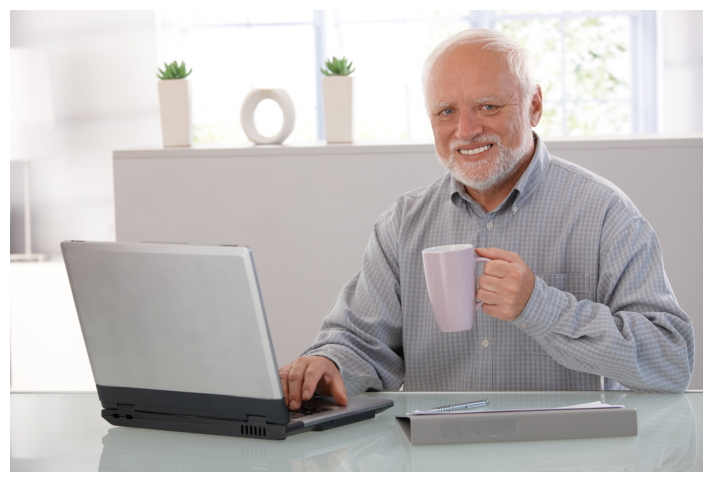

In [11]:
view_img('HideThePain.jpg')

Let's see then the code for that. Below is the GUI implementation, that can be used inside a jupyter notebook. The algorithm scans the photos folder and then for all the pictures with many faces, it draws rectangles over them with the corresponding indices and it prompts the user to decide which index to keep.

In [ ]:
# Note for Cache: You should comment the cache line if you have <16GB ram. 
# Your memory will thank you later

def get_valid_face_index(max_faces):
    """Get user input for face selection with additional options."""
    while True:
        try:
            user_input = input(f"Enter face number (0-{max_faces-1}), -1 for black image, or 's' to skip: ")
            
            if user_input.lower() == 's':
                return None  # Handle skip
            
            value = int(user_input)
            if -1 <= value < max_faces:  # Allow -1 for black image
                return value
            print(f"Error: Number must be between -1 and {max_faces-1}. Try again.")
            
        except ValueError:
            print("Invalid input. Please enter a valid number or 's'.")

class OptimizedDeepFaceProcessor:
    """
    Optimized class that combines face selection and preprocessing.
    It caches face detection results to avoid redundant processing.
    """
    def __init__(self, data, face_size=(224, 224), detector_backend='retinaface', 
                 align=True, expand_percentage=10):
        """
        Initialize the OptimizedDeepFaceProcessor.
        
        Args:
            data: DataFrame containing image data with 'img' column
            face_size: Tuple of (width, height) for resizing faces
            detector_backend: Face detection model to use
            align: Whether to align detected faces
            expand_percentage: Percentage to expand face bounding box
        """
        self.data = data
        self.face_size = face_size
        self.detector_backend = detector_backend
        self.align = align
        self.expand_percentage = expand_percentage
        self.selected_faces = {}  # Dictionary to store selected face indices
        self.face_cache = {}  # Cache for detected faces to avoid re-detection
        
    def detect_faces(self, img, index=None):
        """
        Detect faces using DeepFace with caching.
        
        Args:
            img: Input image (numpy array)
            index: Optional index for caching results
            
        Returns:
            List of detected face information
        """
        # Check cache first if index is provided
        if index is not None and index in self.face_cache:
            return self.face_cache[index]
        
        try:
            # Pass the numpy array directly to DeepFace
            faces = DeepFace.extract_faces(
                img_path=img,  # Directly pass the numpy array
                detector_backend=self.detector_backend,
                align=self.align,
                expand_percentage=self.expand_percentage
            )
            
            # Cache the result if index is provided
            if index is not None:
                self.face_cache[index] = faces
                
            return faces
        except ValueError:
            # Cache empty result
            if index is not None:
                self.face_cache[index] = []
                
            return []  # Return empty list when no faces detected
            
    def show_faces(self, index):
        """Display all detected faces for a given image index."""
        row = self.data.iloc[index]
        img = row['img']
        faces = self.detect_faces(img, index)  # Cache the detection result
        
        if len(faces) == 0:
            print(f"Image at index {index} has no faces detected.")
            return None
        
        if len(faces) == 1:
            print(f"Image at index {index} has only 1 face. No selection needed.")
            return faces
        
        # Create a copy of the image for displaying rectangles
        img_with_rects = img.copy()
        
        # Draw rectangles around detected faces
        for i, face_info in enumerate(faces):
            facial_area = face_info['facial_area']
            x, y = facial_area['x'], facial_area['y']
            w, h = facial_area['w'], facial_area['h']
            
            # Draw rectangle
            color = (0, 255, 0)  # Green rectangle
            cv2.rectangle(img_with_rects, (x, y), (x+w, y+h), color, 2)
            
            # Add index number
            cv2.putText(img_with_rects, str(i), (x, y-10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)
        
        # Display image with rectangles
        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(img_with_rects, cv2.COLOR_BGR2RGB))
        plt.title(f"Select a face by number (0-{len(faces)-1}), or -1 for black image")
        plt.axis('off')
        plt.show()
        
        return faces
    
    def create_black_image(self):
        """Create a black image with the specified face size."""
        return np.zeros(self.face_size + (3,), dtype=np.uint8)
        
    def find_multi_face_images(self):
        """Find all images with multiple faces."""
        multi_face_indices = []
        
        print("Scanning dataset for faces...")
        for i in range(len(self.data)):
            if i % 10 == 0:  # Show progress
                print(f"Scanning {i}/{len(self.data)}...", end="\r")
                
            row = self.data.iloc[i]
            img = row['img']
            faces = self.detect_faces(img, i)  # This will cache results
            if len(faces) > 1:
                multi_face_indices.append(i)
        
        print(f"\nFound {len(multi_face_indices)} images with multiple faces.")
        return multi_face_indices
    
    def select_faces(self):
        """Process the dataset and select faces for images with multiple faces."""
        multi_face_indices = self.find_multi_face_images()
        
        if len(multi_face_indices) == 0:
            return self.selected_faces
        
        # Process each multi-face image
        for idx_count, idx in enumerate(multi_face_indices):
            clear_output(wait=True)
            print(f"Processing image {idx_count+1} of {len(multi_face_indices)} multi-face images (Index: {idx})")
            
            faces = self.show_faces(idx)
            if faces is not None and len(faces) > 1:
                # Get validated input
                selected_index = get_valid_face_index(len(faces))
                
                if selected_index is not None:
                    self.selected_faces[idx] = selected_index
        
        return self.selected_faces
    
    def save_selections(self, filename='face_selections.npy'):
        """Save the selected faces to a file."""
        np.save(filename, self.selected_faces)
        print(f"Saved selections to {filename}")
    
    def load_selections(self, filename='face_selections.npy'):
        """Load the selected faces from a file."""
        try:
            self.selected_faces = np.load(filename, allow_pickle=True).item()
            print(f"Loaded {len(self.selected_faces)} selections from {filename}")
        except FileNotFoundError:
            print(f"File {filename} not found. No selections loaded.")
    
    def process_single_image(self, row, index):
        """Process a single image using cached face detection results."""
        img = row['img']
        faces = self.detect_faces(img, index)  # Use cached results if available
        
        # If no faces were found, return black image
        if len(faces) == 0:
            return self.create_black_image()
        
        # If only one face, use it
        if len(faces) == 1:
            face = faces[0]['face']
            return cv2.resize(face, self.face_size, interpolation=cv2.INTER_AREA)
        
        # If multiple faces and we have a selection for this index, use the selected face
        if index in self.selected_faces:
            selected_idx = self.selected_faces[index]
            
            # Check if user chose -1 (black image)
            if selected_idx == -1:
                return self.create_black_image()
                
            # Use selected face if index is valid
            if 0 <= selected_idx < len(faces):
                face = faces[selected_idx]['face']
                return cv2.resize(face, self.face_size, interpolation=cv2.INTER_AREA)
        
        # Default to the first face if no selection is available
        face = faces[0]['face']
        return cv2.resize(face, self.face_size, interpolation=cv2.INTER_AREA)
    
    def process_dataset(self):
        """Process the entire dataset using cached face detection results."""
        processed_images = []
        
        for index, (_, row) in enumerate(self.data.iterrows()):
            if index % 10 == 0:  # Show progress
                print(f"Processing {index}/{len(self.data)}...", end="\r")
                
            processed_img = self.process_single_image(row, index)
            processed_images.append(processed_img)
            
        print(f"\nProcessed {len(self.data)} images.")
        return np.stack(processed_images)

Now let's run the processor and select the faces

In [ ]:
processor = OptimizedDeepFaceProcessor(
    data=test,
    face_size=(160, 160),
    detector_backend='retinaface',
    align=True,
    expand_percentage=10
)

# Select faces for images with multiple faces
# This will also cache all face detection results
processor.select_faces()

# Save the selections
processor.save_selections('face_selections_test.npy')
#processor.load_selections('face_selections_test.npy')

# Process the entire dataset (will use cached detection results)
processed_data = processor.process_dataset()

print(f"Processed data shape: {processed_data.shape}")
#processed_data

Alright! Now we have the best faces, let's extract the embeddings. We will take a different approach this time. We will try and perform a 3-Fold CV with the train data and train an RF and an SVM model. Then the models will be used to predict upon the deepface embeddings. 

In [ ]:
# Split into training and validation
X_train, X_val, y_train, y_val = train_test_split(
    train_X, train_y, test_size=0.2, stratify=train_y, random_state=42
)

# Apply augmentation to training data only
X_train_aug, y_train_aug = albu_augment_data(X_train, y_train)
print("Extracting embeddings for training set...")

train_embeddings_512 = []
for image in X_train_aug:
    image = image.astype(np.uint8)
    embeddings = DeepFace.represent(
    img_path = image, model_name = "VGG-Face", detector_backend='retinaface',
    enforce_detection=False, align = True
    )
    train_embeddings_512.append(embeddings[0]['embedding'])
print("Extracting embeddings for validation set...")

val_embeddings_512 = []
for image in X_val:
    image = image.astype(np.uint8)
    embeddings = DeepFace.represent(
    img_path = image, model_name = "VGG-Face", detector_backend='retinaface',
    enforce_detection=False, align = True
    )
    val_embeddings_512.append(embeddings[0]['embedding'])


In [33]:
train_embeddings_512 = np.array(train_embeddings_512)
val_embeddings_512 = np.array(val_embeddings_512)

Define RF and SVM as well as their equivalent hyperparameter sweep

In [ ]:
# Handle case where embeddings might be in a complex shape
if len(train_embeddings_512.shape) > 2:
    print(f"Reshaping embeddings from {train_embeddings_512.shape}")
    # Flatten if needed
    train_embeddings = np.reshape(train_embeddings_512, (train_embeddings_512.shape[0], -1))
    val_embeddings = np.reshape(val_embeddings_512, (val_embeddings_512.shape[0], -1))
    print(f"New shape: {train_embeddings.shape}")

# Train Random Forest on embeddings
print("Training Random Forest classifier...")
rf = RandomForestClassifier(
    n_estimators=200,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    max_features='sqrt',
    bootstrap=True,
    n_jobs=-1,
    random_state=42,
    class_weight='balanced'
)

# Hyperparameter tuning with Grid Search (optional)
def tune_random_forest(X_train, y_train, X_val, y_val):
    print("Performing hyperparameter tuning...")
    param_grid = {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': ['sqrt', 'log2']
    }
    
    grid_search = GridSearchCV(
        estimator=RandomForestClassifier(random_state=42, class_weight='balanced'),
        param_grid=param_grid,
        cv=3,
        n_jobs=-1,
        scoring='accuracy',
        verbose=1
    )
    
    grid_search.fit(X_train, y_train)
    
    print(f"Best parameters: {grid_search.best_params_}")
    print(f"Best cross-validation score: {grid_search.best_score_:.4f}")
    
    # Evaluate best model on validation set
    best_rf = grid_search.best_estimator_
    val_predictions = best_rf.predict(X_val)
    val_accuracy = accuracy_score(y_val, val_predictions)
    print(f"Validation accuracy with tuned model: {val_accuracy:.4f}")
    
    return best_rf

In [ ]:
# Train SVM on embeddings
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
# Scale the features for better SVM performance
scaler = StandardScaler()
train_embeddings_scaled = scaler.fit_transform(train_embeddings_512)
val_embeddings_scaled = scaler.transform(val_embeddings_512)

# Configure the SVM
svm = SVC(
    C=10.0,                # Regularization parameter
    kernel='rbf',          # Radial basis function kernel
    gamma='scale',         # Kernel coefficient
    probability=True,      # Enable probability estimates
    class_weight='balanced', # Adjust weights inversely proportional to class frequencies
    random_state=42
)

# Hyperparameter tuning with Grid Search (optional)
def tune_svm(X_train, y_train, X_val, y_val):
    print("Performing hyperparameter tuning...")
    param_grid = {
        'C': [0.1, 1, 10, 100],  # More values for regularization
        'kernel': ['rbf'],  # Include more kernel types
        'gamma': ['scale', 'auto', 0.01, 0.1, 1], 
    }

    
    grid_search = GridSearchCV(
        estimator=SVC(class_weight='balanced', random_state=42, probability=True),
        param_grid=param_grid,
        cv=3,
        n_jobs=-1,
        scoring='accuracy',
        verbose=1
    )
    
    grid_search.fit(X_train, y_train)
    
    print(f"Best parameters: {grid_search.best_params_}")
    print(f"Best cross-validation score: {grid_search.best_score_:.4f}")
    
    # Evaluate best model on validation set
    best_svm = grid_search.best_estimator_
    val_predictions = best_svm.predict(X_val)
    val_accuracy = accuracy_score(y_val, val_predictions)
    print(f"Validation accuracy with tuned model: {val_accuracy:.4f}")
    
    return best_svm

In [48]:
best_rf = tune_random_forest(train_embeddings_512, y_train_aug, val_embeddings_512, y_val)

Performing hyperparameter tuning...
Fitting 3 folds for each of 216 candidates, totalling 648 fits


Best parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Best cross-validation score: 0.9409
Validation accuracy with tuned model: 1.0000


In [37]:
best_svm = tune_svm(train_embeddings_512, y_train_aug, val_embeddings_512, y_val)

Performing hyperparameter tuning...
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters: {'C': 100, 'gamma': 0.1, 'kernel': 'rbf'}
Best cross-validation score: 0.9570
Validation accuracy with tuned model: 1.0000


In [43]:
test_embeddings = []
for image in test_X:
    embeddings = DeepFace.represent(
        img_path = image, model_name = "VGG-Face", detector_backend='retinaface',
        enforce_detection=False, align = True
    )
    test_embeddings.append(embeddings[0]['embedding'])

In [ ]:
predictions = best_rf.predict(np.array(test_embeddings))
# or predictions = best_svm.predict(np.array(test_embeddings))

Now this submission gives us an accuracy score of 98.24%, it even manages to find mila kunis in the following photo


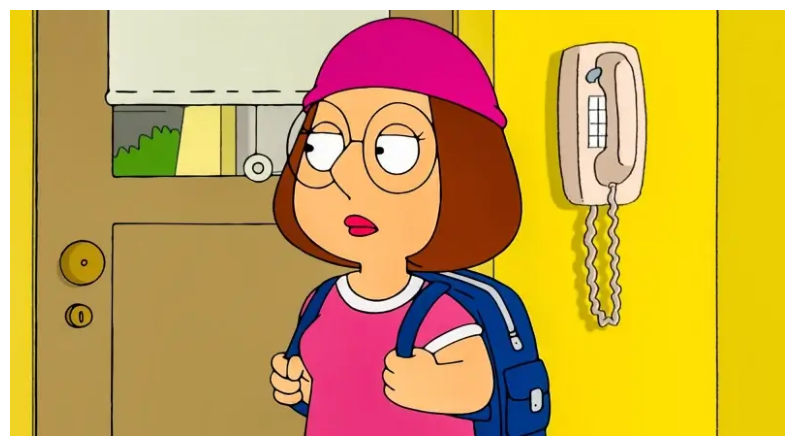

In [12]:
view_img('Meg-Griffin.webp')

Maybe we exaggerated a little bit on the last part :-)

# 5. Publishing best results

In [ ]:
## competition submission: 
df = pd.DataFrame({
    'id': range(len(predictions)),
    'class': predictions
}) 
df.to_csv("submission.csv", index=False)

# 6. Discussion
In summary, we contributed the following:
- Developed and implemented key components of our analysis pipeline, including robust preprocessing techniques and various feature extraction methods.
- Constructed both handcrafted (HOG) and data-driven (PCA-based) feature representations to capture distinctive facial characteristics.
- Designed and evaluated classification strategies to differentiate between faces of different individuals.
- Integrated these contributions into a comprehensive pipeline for the Kaggle competition, ensuring that each step—from face detection to feature extraction and classification—was thoroughly documented.

### Incorporating Assignment Questions

Our work also directly addresses the core questions and requirements of the assignment:
- **Feature Construction:** How can we build effective feature representations using both handcrafted descriptors and features learned from data?
- **Classification Strategy:** How can these feature representations be utilized and compared within the context of classifying faces, particularly distinguishing between similar-looking individuals?
- **Pipeline Improvement:** What improvements can be made in face detection, feature extraction, and model classification to enhance overall performance, and how might these be demonstrated in a Kaggle competition setting?
- **Preprocessing and Data Quality:** What preprocessing steps are necessary to ensure clean, robust, and discriminative features, and why is the quality of input data crucial for reliable analysis?
- **Real-world Application:** How do these approaches translate to real-life scenarios where more training data may be available, but detection conditions are more challenging?

If we had more time, we would:
- Test deep neural networks with the embeddings to further explore model performance.
- Invest additional effort in refining the preprocessing steps to ensure even cleaner and more reliable data.

It is essential to emphasize the importance of clean data and a clear target for each task. In a company, for example, we usually expect clean and well-curated data before proceeding with any analysis. In real-life scenarios, while more training data may be available, the detection conditions can be more challenging, which emphasizes the need for robust data processing and modeling techniques.


### The test set is flawed

Finally, by looking into the test set we have discovered that perfect accuracy is not possible because there are many incorrect images. 
Here is a subset of them 😂😂😂

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

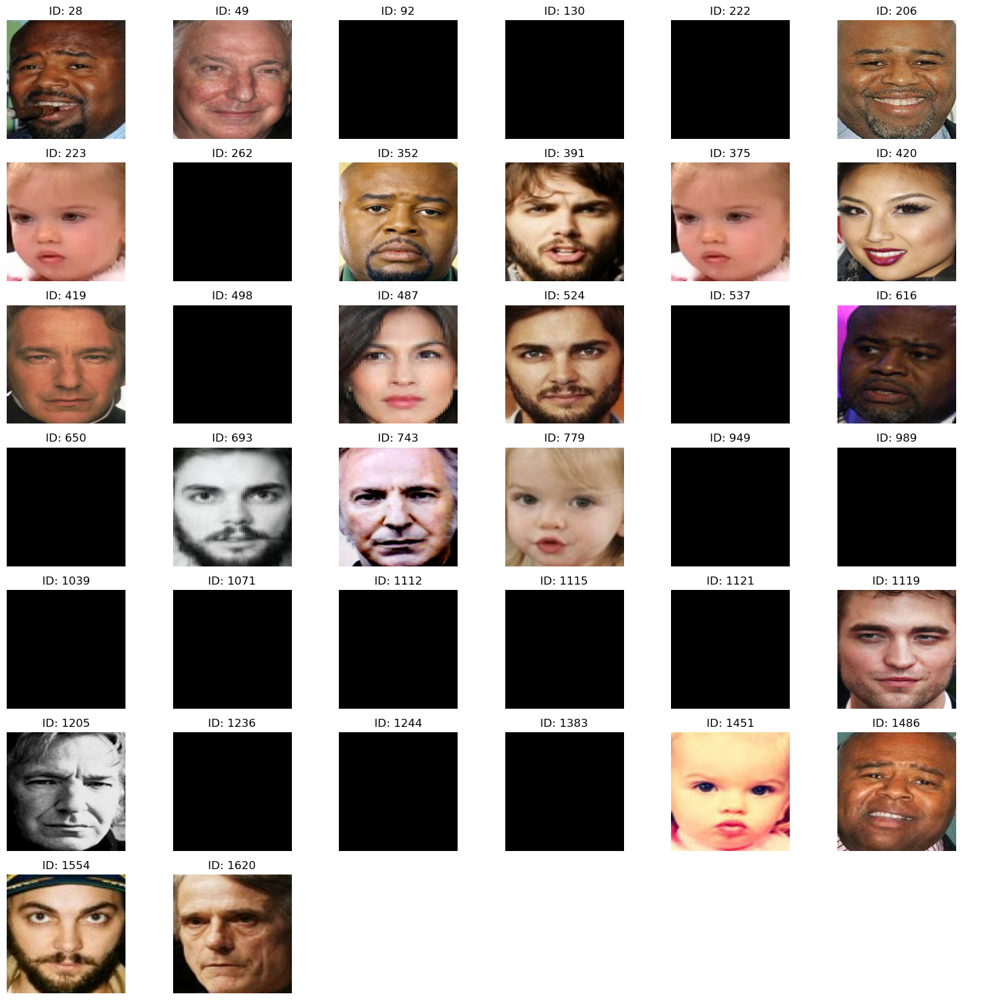

In [27]:
X_test = np.load(r"ex2\fotis_dset\manual_test_X .npy")

ids = [28, 49, 92, 130, 222, 206, 223, 262, 352, 391, 375, 420, 419, 498, 487, 524, 
       537, 616, 650, 693, 743, 779, 949, 989, 1039, 1071, 1112, 1115, 1121, 1119, 
       1205, 1236, 1244, 1383, 1451, 1486, 1554, 1620]
n_images = len(ids)
cols = 6
rows = math.ceil(n_images / cols)
fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
axes = axes.flatten()  
for ax, idx in zip(axes, ids):
    ax.imshow(X_test[idx])
    ax.set_title(f"ID: {idx}")
    ax.axis("off")
for ax in axes[len(ids):]:
    ax.axis("off")
plt.tight_layout()
plt.show()

# Appendix A

# <span style="color: #2E86C1;">HOG (Histogram of Oriented Gradients) Manual</span>

## <span style="color: #27AE60;">Feature Acquisition</span>
Feature acquisition means extracting **useful features** from an image. For instance, imagine taking the moustache from a picture of Salvador Dalí (I cannot think of something more useful).   
[<span style="color: #E74C3C;">**Salvador Dalí's Moustache in all its Glory** (click this to discover the majestic nature of a moustache!)</span>](https://paintvine.co.nz/blogs/news/salvador-dalis-moustache-a-surreal-symbol)

## <span style="color: #27AE60;">How HOG Works</span>

### <span style="color: #E67E22;">1. Edge Detection</span>
HOG examines where there is an abrupt change from light to dark in the image, which essentially means it detects edges.

### <span style="color: #E67E22;">2. Local Regions</span>
The image is divided into small squares, called cells. In each cell, HOG measures the orientations of the edges and builds a small histogram that represents these orientations.

### <span style="color: #E67E22;">3. Overall Description</span>
All these small histograms are combined into one large feature vector. For an image of size 64x128 pixels, this feature vector is 3780 numbers long, describing how the edges are distributed across the entire image.

Simply put, HOG transforms an image into a "numerical fingerprint" containing information about edges and their directions. This fingerprint can then be used for object recognition and other image processing tasks.

## <span style="color: #27AE60;">Useful vs. Redundant Features</span>
When we say some features are "useful" and others "redundant," we mean that we should select the elements in an image that help distinguish the objects of interest, not just represent the image.

For example, if you are building a detector for buttons on shirts and coats:

- **<span style="color: #E67E22;">Useful Features:</span>**
  - Buttons mainly have a distinct shape (circle or ellipse) and clear edges (for designs or holes).
  - Edge information, captured through oriented gradients (like in HOG), is very useful for distinguishing buttons from other circular objects (such as coins or rubber wheels).

- **<span style="color: #E67E22;">Redundant Features:</span>**
  - Color information may not be as important since a button can be any color, and its shape and edges are the more defining characteristics.

Thus, HOG focuses on the distribution of edge orientations, as edges and corners carry reliable shape information. When these features are fed into a classifier (for example, an SVM), they assist in categorizing and recognizing objects (think of Dalí's majestic moustache), while the less discriminative features are considered redundant.


# <span style="color: #2E86C1;">Feature Descriptors</span>

A **feature descriptor** is a compact representation of an image (or a region within an image) that extracts the most significant features while discarding redundant details. Instead of storing every pixel value, the feature descriptor summarizes essential information—such as edges, corners, and shapes—in a way that facilitates tasks like object recognition and image classification.

## <span style="color: #27AE60;">HOG Feature Descriptor (Histogram of Oriented Gradients)</span>

The **HOG Feature Descriptor** is based on the distribution of gradient orientations (i.e., changes in brightness). It operates in the following steps:

- **<span style="color: #E67E22;">Gradient Computation:</span>**  
  The HOG method examines how the brightness of the image changes along the horizontal (x) and vertical (y) directions by calculating gradients for each pixel.

- **<span style="color: #E67E22;">Histogram Creation:</span>**  
  The image is divided into small segments called *cells*. For each cell, HOG computes a histogram that captures the distribution of gradient directions, effectively summarizing the edge orientations.

- **<span style="color: #E67E22;">Normalization and Aggregation:</span>**  
  The histograms from all cells are then normalized and combined into one large feature vector. Understanding that is really important!

  
In summary, the HOG feature descriptor focuses on capturing information about the shape and edges within an image, which is particularly useful for applications like pedestrian detection. By emphasizing edge and corner details while ignoring redundant information such as color, HOG helps improve the accuracy and efficiency of object recognition.


# <span style="color: #2E86C1;">Preprocess of HOG</span>

The first step is to prepare the image for HOG computation. This means:

1. **<span style="color: #27AE60;">Region Selection (patch):</span>**  
   We select a part of the image with a fixed aspect ratio (<span style="color: #E67E22;">consistency across all image patches</span>).

2. **<span style="color: #27AE60;">Resizing:</span>**  
   Once the patch is selected, we resize it to a predefined dimension and ensure that all processed images have the same size!

By doing this, we prepare the image so that we can later compute the HOG descriptor using consistent parameters.


# <span style="color: #2E86C1;">Gradients of the Image</span>

The methodology is as follows:

1. **<span style="color: #27AE60;">Image Preparation:</span>**  
   Initially, we read the image and convert it to a data type that allows precise numerical computations (e.g., float) and normalize the pixel values.

2. **<span style="color: #27AE60;">Extracting Gradients:</span>**  
   We use an operator to compute how the brightness of the image changes in two dimensions: horizontally (**gx**) and vertically (**gy**).  
   <span style="color: #E74C3C;">**We can also achieve the same results by using the Sobel operator in OpenCV with a kernel size of 1.**</span>
   - The horizontal gradient shows where and how much the brightness changes to the right/left.
   - The vertical gradient shows where and how much the brightness changes upward/downward.


# <span style="color: #2E86C1;">Let's dive a bit deeper into the mathematics of gradient magnitude and direction (g<sub>x</sub> and g<sub>y</sub></span>)

Let's take a closer look at what the values of **g<sub>x</sub>** and **g<sub>y</sub>** represent, and how they define the gradient magnitude and direction.

1. **<span style="color: #27AE60;">What are g<sub>x</sub> and g<sub>y</sub>?</span>**  
   - **g<sub>x</sub>:** Measures how the brightness (pixel intensity) changes horizontally.  
     - If **g<sub>x</sub> > 0**, brightness increases from left to right.  
     - If **g<sub>x</sub> < 0**, brightness decreases from left to right.  
     - If **g<sub>x</sub> = 0**, there is no horizontal change in brightness.  
   - **g<sub>y</sub>:** Measures how the brightness changes vertically.  
     - If **g<sub>y</sub> > 0**, brightness increases from top to bottom.  
     - If **g<sub>y</sub> < 0**, brightness decreases from top to bottom.  
     - If **g<sub>y</sub> = 0**, there is no vertical change in brightness.

2. **<span style="color: #27AE60;">Gradient Magnitude (g)</span>**  
   The magnitude of the gradient ($g$) is given by:

$$
g = \sqrt{(g_x)^2 + (g_y)^2}
$$

   - The larger **g** is, the stronger the change in brightness at that point (i.e., a more pronounced edge).
   - If **g** is very small (close to 0), there is little to no change in brightness at that point, indicating no significant edge.

3. **<span style="color: #27AE60;">Gradient Direction (θ)</span>**  
   The direction $\theta$ indicates where the greatest change in brightness occurs. In practice, we often use:

$$
\theta = \arctan\!\biggl(\frac{g_y}{g_x}\biggr)
$$

   - This function (arctan2) correctly accounts for the quadrant where the gradient lies.  
   - For instance:
     - If **g<sub>x</sub> > 0** and **g<sub>y</sub> > 0**, the angle is in the first quadrant (0°–90°).
     - If **g<sub>x</sub> > 0** and **g<sub>y</sub> < 0**, the angle is in the fourth quadrant (270°–360°), and so on.
   - The angle can be expressed in degrees (0°–360°) or radians (0–2π), depending on the application.


# <span style="color: #2E86C1;">Practical Examples and Sign Interpretation</span>

## <span style="color: #27AE60;">1. Everyday Language Examples</span>
- **Large** <span style="color: #E74C3C;">g</span> (e.g., 100): Indicates a strong transition from dark to bright (or the opposite), suggesting a sharp edge.
- **Small** <span style="color: #E74C3C;">g</span> (e.g., 5): Indicates a weak intensity change, suggesting a relatively uniform area.

## <span style="color: #27AE60;">2. How It Relates to HOG</span>
In each *“cell”* within the image, HOG computes the magnitude <span style="color: #E74C3C;">(g)</span> and angle <span style="color: #E74C3C;">(θ)</span> of the gradient for every pixel. These values (binned into angles like 0°, 20°, 40°, …, 160°) form the basis of the HOG implementation (will be explained in detail).

## <span style="color: #27AE60;">3. Summary</span>
- **<span style="color: #E74C3C;">g<sub>x</sub></span> and <span style="color: #E74C3C;">g<sub>y</sub></span>** tell us how quickly and in which direction the brightness changes horizontally and vertically.
- **<span style="color: #E74C3C;">g</span> (magnitude)** indicates how strong that change is overall.
- **<span style="color: #E74C3C;">θ</span> (direction)** indicates where the change is greatest.

---

# <span style="color: #2E86C1;">Interpreting Positive and Negative Signs</span>

To understand whether the brightness is changing from dark to bright or from bright to dark, we look at the signs of the derivatives <span style="color: #E74C3C;">g<sub>x</sub></span> and <span style="color: #E74C3C;">g<sub>y</sub></span>:

1. **Horizontal Direction (<span style="color: #E74C3C;">g<sub>x</sub></span>):**
   - If <span style="color: #E74C3C;">g<sub>x</sub> > 0</span>, brightness increases as you move to the right (dark to bright).
   - If <span style="color: #E74C3C;">g<sub>x</sub> < 0</span>, brightness decreases as you move to the right (bright to dark).

2. **Vertical Direction (<span style="color: #E74C3C;">g<sub>y</sub></span>):**
   - If <span style="color: #E74C3C;">g<sub>y</sub> > 0</span>, brightness increases as you move upward (dark to bright).
   - If <span style="color: #E74C3C;">g<sub>y</sub> < 0</span>, brightness decreases as you move upward (bright to dark).

In simpler terms, the sign (positive or negative) in each direction tells you how the intensity changes. This allows you to determine whether the transition is from bright to dark or the other way around.


# <span style="color: #2E86C1;">Step 3: Calculate Histogram of Gradients in 8×8 Cells</span>

In this step, the image is divided into 8×8 cells and a histogram of gradients is calculated for each 8×8 cell. Let's break it down step-by-step:

1. **<span style="color: #27AE60;">8×8 Image Patch:</span>**  
   A small part of the image with dimensions **8×8 pixels**.

2. **<span style="color: #27AE60;">8×8×3 = 192 Pixel Values:</span>**  
   - Each pixel has **3 channels** (e.g., R, G, B).  
   - So, each of the 64 pixels provides 3 numbers that describe the colors (red, green, blue).  
   - In total, we have **64 × 3 = 192 numbers** (pixel values).

3. **<span style="color: #27AE60;">8×8×2 = 128 Numbers for the Gradient:</span>**  
   - For gradient calculation, we typically extract 2 values per pixel: the **magnitude** and the **angle** of the gradient.  
   - Therefore, for 64 pixels, we get **64 × 2 = 128 numbers** that describe how the brightness changes in that image patch.

**In summary:**  
- When we keep just the color values, each pixel contributes **3 numbers (RGB)**.  
- When capturing gradient information, each pixel contributes **2 numbers (magnitude and angle)**.


# <span style="color: #2E86C1;">Step 4: Forming the 9-Bin Histogram from the Gradients</span>

By the end of this section we will see how these 128 numbers are represented using a 9-bin histogram which can be stored as an array of 9 numbers.

Let's explain how the 128 numbers (from the gradients of an 8×8 patch, 2 numbers per pixel) are converted into a 9-bin histogram:

1. **<span style="color: #27AE60;">Division of Angles:</span>**  
   - The gradient angles (directions) for each pixel range from **0° to 180°** (unsigned).  
   - We divide this range into **9 equal intervals**; thus, each bin covers **20°** (e.g., 0–20°, 20–40°, ..., 160–180°).

2. **<span style="color: #27AE60;">Voting in Each Bin:</span>**  
   - For each pixel in the 8×8 patch, we have two values: the **magnitude** and the **direction** of the gradient.  
   - If the pixel's direction falls exactly into one bin, then the pixel "votes" for that bin by adding its magnitude.  
   - If the direction lies between two adjacent bins, the vote is split proportionally between the two bins based on its closeness to each boundary.

3. **<span style="color: #27AE60;">Summary of Votes:</span>**  
   - We repeat the process for all pixels in the patch.  
   - We sum up all the votes (i.e., the contributions of the magnitudes) for each of the **9 bins**.

4. **<span style="color: #27AE60;">Final Histogram:</span>**  
   - The result is an array of **9 numbers** (one for each bin), summarizing the distribution of gradient directions within the patch.  
   - This histogram compactly represents all the essential edge and gradient information compared to the original 128 numbers.


# <span style="color: #2E86C1;">Example: Converting 128 Gradient Values to a 9-Bin Histogram</span>

We convert the 128 numbers (from an 8×8 patch, with 2 values per pixel: magnitude and direction) into a **9-bin histogram**. We split the angle range **[0°, 180°)** into 9 equal bins (each covering **20°**):

- **Bin 0:** 0°–20°  
- **Bin 1:** 20°–40°  
- **Bin 2:** 40°–60°  
- **Bin 3:** 60°–80°  
- **Bin 4:** 80°–100°  
- **Bin 5:** 100°–120°  
- **Bin 6:** 120°–140°  
- **Bin 7:** 140°–160°  
- **Bin 8:** 160°–180°

In our HOG method, we use **linear interpolation** during the voting process. This means that if a pixel's gradient direction falls between two bins, its vote (magnitude) is split proportionally between them.

<span style="color: #E74C3C;">**Simplified Example with 3 Pixels:**</span>

1. **Pixel 1:**  
   - **Magnitude:** 4  
   - **Direction:** 10°  
   - *Interpretation:* Falls in the 0°–20° range.  
     - With interpolation, the vote might split equally: **2** to **Bin 0** and **2** to **Bin 1**.

2. **Pixel 2:**  
   - **Magnitude:** 2  
   - **Direction:** 80°  
   - *Interpretation:* Lies at the boundary between **Bin 3 (60°–80°)** and **Bin 4 (80°–100°)**.  
     - Vote split: **1** to **Bin 3** and **1** to **Bin 4**.

3. **Pixel 3:**  
   - **Magnitude:** 3  
   - **Direction:** 165°  
   - *Interpretation:* Falls in **Bin 8 (160°–180°)**. Due to wrapping (0° and 180° being equivalent), part of the vote may go to **Bin 0**.  
     - Example split: **75%** (≈2.25) to **Bin 0** and **25%** (≈0.75) to **Bin 8**.

**Final Histogram (Summing the Votes):**
- **Bin 0:** 2 (from Pixel 1) + 2.25 (from Pixel 3) = **4.25**
- **Bin 1:** 2 (from Pixel 1) = **2**
- **Bin 3:** 1 (from Pixel 2) = **1**
- **Bin 4:** 1 (from Pixel 2) = **1**
- **Bin 8:** 0.75 (from Pixel 3) = **0.75**
- **Other Bins:** 0

Thus, the final histogram is:  
**[4.25, 2, 0, 1, 1, 0, 0, 0, 0.75]**

<span style="color: #E74C3C;">Note:</span>  
- If bins are strictly defined as intervals (e.g., 0–20, 20–40), Pixel 1's entire vote would go to **Bin 0**.
  
<span style="color: #E74C3C;">**Additional Note:**</span>  
Using interpolation helps reduce sensitivity to the exact bin boundaries. **Interpolation** in this context means that when a pixel's gradient direction falls near the boundary between two bins, its vote (i.e., the magnitude) is split between those bins proportionally (for instance 25% on the first bin and 75% on the second bin). This avoids abrupt changes in the histogram when the gradient direction shifts slightly, leading to a smoother and more robust representation of the edge information.


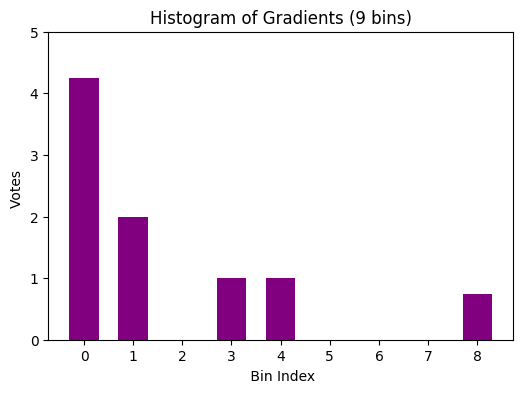

In [ ]:
#Visual Representation of the Bins' Distribution
import matplotlib.pyplot as plt

# Bin indices (0 through 8)
bins = list(range(9))

# Histogram values corresponding to each bin
values = [4.25, 2, 0, 1, 1, 0, 0, 0, 0.75]

plt.figure(figsize=(6, 4))
plt.bar(bins, values, color='purple', width=0.6)
plt.xlabel(' Bin Index')
plt.ylabel('Votes ')
plt.title('Histogram of Gradients (9 bins)')
plt.xticks(bins)  # Ensure x-axis shows 0 to 8
plt.ylim([0, 5])  # Optional: set a limit for the y-axis

plt.show()


# <span style="color: #2E86C1;">Step 4: 16×16 Block Normalization</span>

In HOG, we normalize the histograms within larger blocks (e.g., **16×16** pixels) to make the descriptor **independent of changes in lighting**. Here’s why it matters:

---

## <span style="color: #27AE60;">Why Normalization?</span>

Think of a simple **RGB vector** such as **[128, 64, 32]**:
- The sum of these values is **128 + 64 + 32 = 224**.  
- Normalizing each component by dividing by 224 yields approximately **[0.57, 0.28, 0.14]**.

If you scale the brightness of this vector by a factor of 2, you get **[256, 128, 64]**:
- The sum is now **256 + 128 + 64 = 448**.  
- Normalizing by dividing each component by 448 yields the same normalized vector **[0.57, 0.28, 0.14]**.

This simple example shows how **multiplying all values by a constant** changes the raw numbers but **does not affect** the final **normalized** result.

---

## <span style="color: #27AE60;">Block Normalization in HOG</span>

- **<span style="color: #E74C3C;">Removing Scale (Brightness) Effects:</span>**  
  If an image becomes brighter or darker (e.g., by multiplying all pixel values by a constant), the raw histogram values will also change. By **normalizing**, we eliminate this dependence on the overall intensity.

- **<span style="color: #E74C3C;">Robust Feature Vector:</span>**  
  After normalization, the resulting feature vector captures the **pattern** of gradients rather than their absolute magnitudes. This makes the descriptor **more reliable** and comparable across images with different lighting conditions.

In simpler terms, **block normalization** ensures that even if two images differ in overall brightness, their HOG descriptors can still match if the shapes and edges they contain are the same.


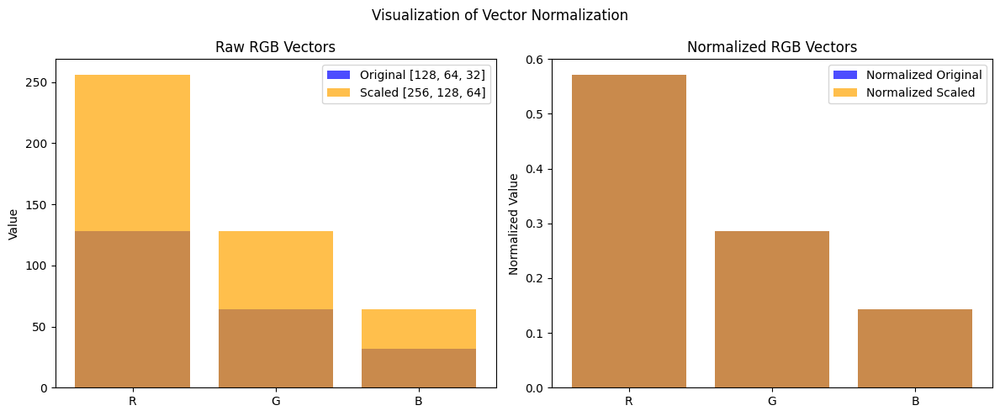

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Original RGB vector and its scaled version
rgb_original = np.array([128, 64, 32])
rgb_scaled = rgb_original * 2

# Compute the sums
sum_original = np.sum(rgb_original)
sum_scaled = np.sum(rgb_scaled)

# Compute normalized vectors
rgb_normalized = rgb_original / sum_original
rgb_scaled_normalized = rgb_scaled / sum_scaled

# Labels for the color channels
labels = ['R', 'G', 'B']

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Plot raw RGB values
axs[0].bar(labels, rgb_original, color='blue', alpha=0.7, label='Original [128, 64, 32]')
axs[0].bar(labels, rgb_scaled, color='orange', alpha=0.7, label='Scaled [256, 128, 64]')
axs[0].set_title('Raw RGB Vectors')
axs[0].set_ylabel('Value')
axs[0].legend()

# Plot normalized RGB values
axs[1].bar(labels, rgb_normalized, color='blue', alpha=0.7, label='Normalized Original')
axs[1].bar(labels, rgb_scaled_normalized, color='orange', alpha=0.7, label='Normalized Scaled')
axs[1].set_title('Normalized RGB Vectors')
axs[1].set_ylabel('Normalized Value')
axs[1].legend()

plt.suptitle('Visualization of Vector Normalization')
plt.tight_layout()
plt.show()


# <span style="color: #2E86C1;">Normalization over a Larger Block</span>

Now that we know how to normalize a vector, you might be tempted to think that while calculating HOG you can simply normalize the **9×1 histogram (the 9 Bins)**  While that's not a bad idea, a better approach is to normalize over a larger block.

Consider a **16×16 block**:
- This block contains **4 histograms** (each from an 8×8 cell), which can be concatenated to form a **36×1 vector**.
- This 36×1 vector can then be normalized just like a 3×1 vector.

The process is as follows:
- The normalization window (16×16 block) is moved by **8 pixels** at a time (<span style="color: #E74C3C;">see animation for details</span>).
- At each window position, a normalized **36×1 vector** is computed.
- The process is repeated over the entire image.

This larger block normalization ensures that the HOG descriptor is more robust to variations in lighting and contrast.


# <span style="color: #2E86C1;">Step 5: Calculate the Histogram of Oriented Gradients Feature Vector</span>

1. **<span style="color: #27AE60;">With the 16×16 Block:</span>**  
   The image is divided into smaller blocks of size **16×16 pixels**. For each block, we have already computed histograms for the contained 8×8 cells, and after normalization, each block is represented by a **36-element vector**.

2. **<span style="color: #27AE60;">Block Positions:</span>**  
   The process is carried out by sliding the 16×16 block over the image. In our example, the image dimensions allow:
   - **7 positions horizontally**
   - **15 positions vertically**  
   Thus, there are a total of **7 × 15 = 105 blocks**.

3. **<span style="color: #27AE60;">Merging the Block Vectors:</span>**  
   Each of the 105 blocks produces a **36-element vector**. By concatenating these vectors element by element, the final feature vector for the image patch has a dimension of:

   $$
   36 \times 105 = 3780 \text{ elements.}
   $$

   In other words, the final HOG feature vector for the image patch is a **3780-dimensional vector** that encapsulates the edge pattern information across the entire image.


# <span style="color: #2E86C1;">Visualizing Histogram of Oriented Gradients</span>

The HOG descriptor of an image patch is usually visualized by plotting the **9×1 normalized histograms (9 Bins)** in the **8×8 cells**. In the resulting visualization, you can observe that the dominant direction in the histogram effectively captures the shape of the person, especially around the torso and legs.



# <span style="color: #2E86C1;">Conclusion of the HOG Process</span>

The **<span style="color: #E74C3C;">Histogram of Oriented Gradients (HOG)</span>** descriptor is a powerful tool for capturing the shape and structure of objects in an image. Here’s a brief summary of its key steps and benefits:

- **<span style="color: #27AE60;">Preprocessing:</span>**  
  The image is first preprocessed by selecting a region (or patch) and resizing it to a fixed dimension (e.g., **64×128 pixels**). This ensures <span style="color: #E67E22;">consistency</span> across different images.

- **<span style="color: #27AE60;">Gradient Extraction:</span>**  
  Gradients (both <span style="color: #E74C3C;">magnitude</span> and <span style="color: #E74C3C;">direction</span>) are computed for each pixel, capturing how the brightness changes. These gradients highlight the edges and structures within the image.

- **<span style="color: #27AE60;">Cell-Level Histogram Formation:</span>**  
  The image is divided into small **8×8 cells**. For each cell, a **<span style="color: #E74C3C;">9-bin histogram</span>** is calculated—each bin representing a range of gradient directions (0°–180° divided into 9 equal intervals).  
  <span style="color: #E67E22;">(The 9×1 histogram represents the distribution of gradient orientations within that cell.)</span>

- **<span style="color: #27AE60;">Block Normalization:</span>**  
  To make the descriptor robust against variations in lighting and contrast, adjacent 8×8 cell histograms are concatenated into larger **16×16 blocks**. Each block forms a **36×1 vector** (since 4 cells × 9 bins = 36), which is then normalized.  
  The normalization window is moved across the image (typically by **8 pixels** with overlap), ensuring that local contrast differences are minimized and the descriptor becomes invariant to changes in brightness.

- **<span style="color: #27AE60;">Final Feature Vector:</span>**  
  The normalized vectors from all blocks are concatenated to produce the final HOG feature vector (e.g., **3780 elements** for a 64×128 image patch). This vector encapsulates the edge and gradient structure of the image in a compact form, making it highly effective for tasks such as object detection and recognition.

In summary, the HOG descriptor efficiently summarizes the distribution of gradient orientations across an image, resulting in a robust and invariant feature representation that is particularly well-suited for detecting objects like pedestrians. This process removes dependency on absolute brightness, allowing for consistent detection even under varying lighting conditions.
